In [ ]:
import pandas as pd

# Step 1: Read dataset from Excel file
input_excel_file = '/content/reduced_gene_dataset.xlsx'
data = pd.read_excel(input_excel_file)

# Step 2: Transpose the dataset
transposed_data = data.transpose()

# Step 3: Write transposed dataset to Excel file
output_excel_file = 'transposed_datav1.xlsx'
#transposed_data.to_excel(output_excel_file, index=False, header=False)
transposed_data.to_excel(output_excel_file, header=True)

In [ ]:
#preporcessing the gene file to remove all zeros and maximum zeros

import csv

# Input and output file paths
input_file_path = '/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv'
output_file_path = 'filtered_output_filev2.csv'

# Read data from the CSV file
with open(input_file_path, 'r') as csv_file:
    # Create a CSV reader object
    csv_reader = csv.reader(csv_file)

    # Get the header
    header = next(csv_reader)

    # Create a list to store non-zero rows
    non_zero_rows = [header]

    # Iterate through rows and filter out rows with all zeros or excessive zeros
    for row in csv_reader:
        # Check if the row has at least one non-zero value
        if any(float(value) != 0 for value in row[1:]):
            # Check if the number of zeros is less than (number of columns - 3)
            if row.count('0') < len(row) - 4:
                non_zero_rows.append(row)

# Write the non-zero rows to a new CSV file
with open(output_file_path, 'w', newline='') as csv_output_file:
    # Create a CSV writer object
    csv_writer = csv.writer(csv_output_file)

    # Write the non-zero rows
    csv_writer.writerows(non_zero_rows)

print(f"Filtered data has been written to {output_file_path}")


Filtered data has been written to filtered_output_filev2.csv


In [ ]:
from openpyxl import Workbook
import csv
wb=Workbook()
ws = wb.active
with open('/content/drive/MyDrive/brats_gene/personpt002_gpu_5_0.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('/content/drive/MyDrive/brats_gene/personpt002_gpu_5_0.xlsx')

In [ ]:
import pandas as pd
from openpyxl import Workbook
import csv
#remove pearson value with -0.000 and 0.000,-0.002,0.002
#used for radiogenomics

# Read the CSV file into a DataFrame
file_path = '/content/drive/MyDrive/brats_gene/personpt002_gpu_5_0.csv'
df = pd.read_csv(file_path)
print(df.columns)
# Specify the column name and the value to be removed
column_name = 'pearson_coef'
values_to_remove = [-0.002,0.002,0.000,-0.000]#[-0.000, 0.000]

# Remove rows where the specified column has the specific value
df = df[~df[column_name].isin(values_to_remove)]

# Save the modified DataFrame back to a CSV file if needed
df.to_csv('personpt002_gpu5_0_v.csv', index=False)

# Display the modified DataFrame
print(df.shape)
wb=Workbook()
ws = wb.active
with open('personpt002_gpu5_0_v.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('personpt002_gpu5_0_v.xlsx')
#with both personpt002_gpu5_0_modified and personpt002_gpu5_1_modified, total filtered genes =8,09,686

Index(['column1', 'column2', 'pearson_coef', 'spearman', 'count'], dtype='object')
(524630, 5)


In [ ]:
#removing redundant strings
import pandas as pd


# Read the CSV file into a DataFrame
file_path = '/content/Book4.xlsx'# '/content/Book3.xlsx' '/content/Book4.xlsx'
df = pd.read_excel(file_path)


# Specify the two columns you want to compare and extract unique words from
#data = {'column1': ['A', 'B', 'C'],
        #'column2': ['D', 'A', 'E']}
#df = pd.DataFrame(data)
# Specify the two columns
column1_name = 'column1'
column2_name = 'column2'

# Extract unique words from the specified columns
words_column1 = set(df[column1_name].astype(str))
print("column1",len(list(words_column1)))
words_column2 = set(df[column2_name].astype(str))
print("column2",len(list(words_column2)))

unique_words_combined=set()
unique_words_combined = words_column1 | words_column2
unique_words_combined1=set(unique_words_combined)
unique_words_list = list(unique_words_combined)

print("unique_words_combined",len(unique_words_combined))
print("unique_words_combined",len(list(unique_words_combined)))


# Create a DataFrame with the unique words
unique_words_df = pd.DataFrame({'Unique Words':unique_words_list})

# Write the DataFrame to a new CSV file
output_file_path = 'person_uniquebook4.csv'
unique_words_df.to_csv(output_file_path, index=False)

print(f"Unique words have been written to {output_file_path}")





column1 2629
column2 2759
unique_words_combined 5388
unique_words_combined 5388
Unique words have been written to person_uniquebook4.csv


In [ ]:
#removing redundant strings
import pandas as pd


# Read the CSV file into a DataFrame
file_path = '/content/person_uniquebook3 (2).csv'#'/content/Book4.xlsx'
df1 = pd.read_csv(file_path)
print("df1",df1.shape)
file_path1 = '/content/person_uniquebook4.csv'
df2 = pd.read_csv(file_path1)
print("df2",df2.shape)

# Specify the two columns you want to compare and extract unique words from
#data = {'column1': ['A', 'B', 'C'],
        #'column2': ['D', 'A', 'E']}
#df = pd.DataFrame(data)
# Specify the two columns
column1_name = 'Unique Words'
column2_name = 'Unique Words'

# Extract unique words from the specified columns
words_column1 = set(df1[column1_name].astype(str))
print("column1",len(list(words_column1)))
words_column2 = set(df2[column2_name].astype(str))
print("column2",len(list(words_column2)))

unique_words_combined=set()
unique_words_combined = words_column1 | words_column2
unique_words_combined1 =set(unique_words_combined)
unique_words_list = list(unique_words_combined)

print("unique_words_combined",len(unique_words_combined))
print("unique_words_combined",len(list(unique_words_combined1)))

# Create a DataFrame with the unique words
unique_words_df = pd.DataFrame({'Unique Words': unique_words_list})

# Write the DataFrame to a new CSV file
output_file_path = 'person_unique_combined.csv'
unique_words_df.to_csv(output_file_path, index=False)

print(f"Unique words have been written to {output_file_path}")


df1 (871, 1)
df2 (5129, 1)
column1 871
column2 5129
unique_words_combined 5821
unique_words_combined 5821
Unique words have been written to person_unique_combined.csv


In [ ]:
from openpyxl import Workbook
import csv
wb=Workbook()
ws = wb.active
with open('person_unique_combined.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('person_unique_combined.xlsx')

In [ ]:
import pandas as pd

# Read the first Excel file into a DataFrame
df = pd.read_excel("/content/person_unique_combined.xlsx")
print(df.shape)
# Extract unique values from the DataFrame and convert them to a list
unique_values = df.values.flatten().tolist()
print(len(unique_values))
print(len(set(unique_values)))
# Read the second Excel file into another DataFrame
df_gene = pd.read_excel("/content/filtered_output_filev5.xlsx")
print(df_gene.shape)
# Initialize an empty list to store matching rows
matching_rows = []

# Iterate over the rows of the DataFrame
for index, row in df_gene.iterrows():
    # Check if any cell in the specified column matches any string in the list
    if any(str(row[0]) == string for string in unique_values):
        # If a match is found, append the entire row to the matching_rows list
        #print(row[0])
        matching_rows.append(row)
print(" matching_rows",len( matching_rows))
# Convert the list of matching rows to a DataFrame
matching_df = pd.DataFrame(matching_rows)

# Write the matching DataFrame to a new Excel file
matching_df.to_excel("/content/matching_rows.xlsx", index=False)
#Repeating strings: ['Metazoa_SRP', 'POLR2J4', 'BMS1P4', 'TMSB15B', 'ALG1L9P', 'Y_RNA', 'DNAJC9-AS1', 'RGS5']

(5821, 1)
5821
5821
(20284, 35)
 matching_rows 5829


In [ ]:
#finding redundancy
from collections import Counter

# Your list of strings

import pandas as pd

# Read the CSV file and select the column you want
#df = pd.read_csv("/content/personpt002_gpu5_v_combine_final_unique.csv", usecols=["Unique Words"])
#df = pd.read_excel("/content/filtered_output_filev5.xlsx", usecols=["gene_name"])
df = pd.read_excel("/content/person_unique_combined.xlsx", usecols=["Unique Words"])

# Convert the column to string
unique = df["Unique Words"].values.flatten().tolist()

# Print the length of the unique list
print("unique", len(unique))
unique_values = set(df["Unique Words"].values.flatten())
print("unique_values",len(unique_values))

string_counts = Counter(unique)

# Find repeating strings (strings with count greater than 1)
repeating_strings = [string for string, count in string_counts.items() if count > 1]

print("Repeating strings:", repeating_strings)

#unique 20284
#unique_values 20272
#Repeating strings: ['Metazoa_SRP', 'POLR2J4', 'BMS1P4', 'TMSB15B', 'ALG1L9P', 'Y_RNA', 'DNAJC9-AS1', 'RGS5']


unique 5821
unique_values 5821
Repeating strings: []


In [ ]:
import pandas as pd

# Read the first Excel file into a DataFrame
df = pd.read_excel("/content/person_unique_combined.xlsx")
print(df.shape)
# Extract unique values from the DataFrame and convert them to a set for faster lookup
unique_values = df.values.flatten().tolist()
print("unique_values",len(unique_values))
# Read the second Excel file into another DataFrame
df_gene = pd.read_excel("/content/filtered_output_filev5.xlsx")

# Initialize an empty list to store matching rows
matching_rows = []
matching_nonrows = []

# Define the cell number to check in each row
cell_number_to_check = 0  # Change this to the desired cell number (0-indexed)

# Iterate over the rows of the second DataFrame
for index, row in df_gene.iterrows():
    # Get the value of the cell at the specified cell number in the row
    cell_value = row.iloc[cell_number_to_check]
    #print("row",row.iloc[cell_number_to_check])
    # Check if the cell value is in the unique values set
    if str(cell_value) in unique_values:
        # If a match is found, append the row to the matching_rows list
        matching_rows.append(row)
    else:
        matching_nonrows.append(row)

# Convert the list of matching rows to a DataFrame
matching_df = pd.DataFrame(matching_rows)
print("matching_rows",len(matching_df))
print("matching_rows",len(matching_nonrows))
print(matching_nonrows)
# Write the matching DataFrame to a new Excel file
matching_df.to_excel("/content/feature_selectionv5.xlsx", index=False)


(5821, 1)
unique_values 5821
matching_rows 5829
matching_rows 14455


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
#removing redundant strings and forming final combined unique gene information
import pandas as pd

# Read the CSV file into a DataFrame
file_path = '/content/personpt002_gpu5_0_1_v_unique_words_final.csv'#'/content/Book4.xlsx'
df1 = pd.read_csv(file_path)

# Read the CSV file into a DataFrame
file_path = '/content/personpt002_gpu5_0_2_v_unique_words_final.csv'#'/content/Book4.xlsx'
df2 = pd.read_csv(file_path)

# Specify the two columns you want to compare and extract unique words from
#data = {'column1': ['A', 'B', 'C'],
        #'column2': ['D', 'A', 'E']}
#df = pd.DataFrame(data)
# Specify the two columns
# Specify the two columns you want to compare and extract unique words from
column1_name = 'Unique Words'
column2_name = 'Unique Words'

# Access the specified columns
column1 = df1[column1_name]
column2 = df2[column2_name]
print("column1",len(df1[column1_name]))
print("column1",len(df2[column2_name]))
# Extract unique words from the specified columns
words_column1 = set(df1[column1_name].astype(str))
print("column1",len(list(words_column1)))
words_column2 = set(df2[column2_name].astype(str))
print("column2",len(list(words_column2)))

unique_words_combined=set()
unique_words_combined = words_column1 | words_column2

unique_words_list = list(unique_words_combined)

print("unique_words_combined",len(unique_words_combined))


# Create a DataFrame with the unique words
unique_words_df = pd.DataFrame({'Unique Words': unique_words_list})

# Write the DataFrame to a new CSV file
output_file_path = 'personpt002_gpu5_v_unique_wordscombine_final.csv'
unique_words_df.to_csv(output_file_path, index=False)

print(f"Unique words have been written to {output_file_path}")





column1 896
column1 5388
column1 896
column2 5388
unique_words_combined 6191
Unique words have been written to personpt002_gpu5_v_unique_wordscombine_final.csv


In [ ]:
import pandas as pd
#remove pearson value with -0.000 and 0.000
#used for radiogenomics

import pandas as pd

# Read the CSV file into a DataFrame
file_path = '/content/personpt002_gpu5_0_modified.csv'
df = pd.read_csv(file_path)

# Specify the column name and the threshold value
column_name = 'pearson_coef'
lower_threshold = -0.001
upper_threshold = 0.001

# Remove rows where the specified column has values greater than the threshold
df = df[(df[column_name] >= lower_threshold) & (df[column_name] <= lower_threshold)]

# Save the modified DataFrame back to a CSV file if needed
df.to_csv('/content/personpt002_gpu5_0_modifiedv2.csv', index=False)

# Display the modified DataFrame
print(df.shape)

# Display the modified DataFrame
print(df)
wb=Workbook()
ws = wb.active
with open('/content/personpt002_gpu5_0_modifiedv2.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('/content/personpt002_gpu5_0_modifiedv2.xlsx')
#with both personpt002_gpu5_0_modified and personpt002_gpu5_1_modified, total filtered genes =8,09,686

(262276, 5)
           column1      column2  pearson_coef  spearman    count
0       AP006621.6     Z95118.2        -0.001     0.264        2
6       AP006621.6   AC079148.1        -0.001     0.004       11
8       AP006621.6     EIF4A1P4        -0.001     0.327       14
10      AP006621.6      CCDC71L        -0.001    -0.095       17
12      AP006621.6     H2AZ1-DT        -0.001     0.117       21
...            ...          ...           ...       ...      ...
786621      IL17RD         ANK1        -0.001     0.137  1048554
786628       PTPRG        RAB17        -0.001     0.009  1048563
786630       PTPRG       RNF170        -0.001     0.154  1048566
786634       PTPRG       BTN3A3        -0.001     0.015  1048571
786635       PTPRG         MDM1        -0.001     0.132  1048572

[262276 rows x 5 columns]


In [ ]:
import csv

# Input and output file paths
input_file_path = '/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv'
output_file_path = 'filtered_output_filev5.csv'

# Read data from the CSV file
with open(input_file_path, 'r') as csv_file:
    # Create a CSV reader object
    csv_reader = csv.reader(csv_file)

    # Get the header
    header = next(csv_reader)

    # Create a list to store non-zero rows
    non_zero_rows = [header]

    # Iterate through rows and filter out rows that contain any zero
    for row in csv_reader:
        # Check if there is no zero in the row
        if '0' not in row[1:]:
            non_zero_rows.append(row)

# Write the non-zero rows to a new CSV file
with open(output_file_path, 'w', newline='') as csv_output_file:
    # Create a CSV writer object
    csv_writer = csv.writer(csv_output_file)

    # Write the non-zero rows
    csv_writer.writerows(non_zero_rows)

print(f"Filtered data has been written to {output_file_path}")


Filtered data has been written to filtered_output_filev5.csv


In [ ]:
#preprocessing the gene file to remove all zeros and more than half of column zeros

import csv
from math import floor

# Input and output file paths
input_file_path = '/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv'
output_file_path = 'filtered_output_filev3.csv'

# Read data from the CSV file
with open(input_file_path, 'r') as csv_file:
    # Create a CSV reader object
    csv_reader = csv.reader(csv_file)

    # Get the header
    header = next(csv_reader)

    # Create a list to store non-zero rows
    non_zero_rows = [header]
    half_num_columns = floor(len(header) / 2)
    print("half_num_columns",half_num_columns)
    # Iterate through rows and filter out rows with all zeros or excessive zeros
    for row in csv_reader:
        # Check if the row has at least one non-zero value
        if any(float(value) != 0 for value in row[1:]):
            # Check if the number of zeros is less than (number of columns - 3)
            if row.count('0') < half_num_columns:
                non_zero_rows.append(row)

# Write the non-zero rows to a new CSV file
with open(output_file_path, 'w', newline='') as csv_output_file:
    # Create a CSV writer object
    csv_writer = csv.writer(csv_output_file)

    # Write the non-zero rows
    csv_writer.writerows(non_zero_rows)

print(f"Filtered data has been written to {output_file_path}")


half_num_columns 17
Filtered data has been written to filtered_output_filev3.csv


**Final version of preprocessing, removing row with more than 5 zeros**

In [ ]:
#final version used to reduce2/2/2024

import csv

# Input and output file paths
input_file_path = '/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv'
output_file_path = 'filtered_output_filev4.csv'

# Read data from the CSV file
with open(input_file_path, 'r') as csv_file:
    # Create a CSV reader object
    csv_reader = csv.reader(csv_file)

    # Get the header
    header = next(csv_reader)

    # Create a list to store non-zero rows
    non_zero_rows = [header]

    # Iterate through rows and filter out rows with all zeros or more than 5 zeros
    for row in csv_reader:
        # Check if the row has at least one non-zero value
        if any(float(value) != 0 for value in row[1:]):
            # Check if the number of zeros is less than or equal to 5
            if row.count('0') <= 5:
                non_zero_rows.append(row)

# Write the non-zero rows to a new CSV file
with open(output_file_path, 'w', newline='') as csv_output_file:
    # Create a CSV writer object
    csv_writer = csv.writer(csv_output_file)

    # Write the non-zero rows
    csv_writer.writerows(non_zero_rows)

print(f"Filtered data has been written to {output_file_path}")


Filtered data has been written to filtered_output_filev4.csv


In [ ]:
import csv

# Input and output file paths
input_file_path = '/content/GENE.csv'
output_file_path = 'filtered_output_file.csv'

# Read data from the CSV file
with open(input_file_path, 'r') as csv_file:
    # Create a CSV reader object
    csv_reader = csv.reader(csv_file)

    # Get the header
    header = next(csv_reader)

    # Create a list to store non-zero and non-all-zeros rows
    non_zero_rows = [header]

    # Iterate through rows and filter out rows based on conditions
    for row in csv_reader:
        # Check if all values in the row are not zero
        if any(float(value) != 0 for value in row[1:]):
            # Count the number of zeros in the row
            num_zeros = sum(1 for value in row[1:] if float(value) == 0)

            # Check if the number of zeros is not equal to (number of columns - 3)
            if num_zeros != len(row) - 3:
                non_zero_rows.append(row)
print(non_zero_rows)
# Write the non-zero and non-all-zeros rows to a new CSV file
with open(output_file_path, 'w', newline='') as csv_output_file:
    # Create a CSV writer object
    csv_writer = csv.writer(csv_output_file)

    # Write the non-zero and non-all-zeros rows
    csv_writer.writerows(non_zero_rows)

print(f"Filtered data has been written to {output_file_path}")


[['gene_name', 'BraTS20_Training_166', 'BraTS20_Training_182', 'BraTS20_Training_184', 'BraTS20_Training_167', 'BraTS20_Training_200', 'BraTS20_Training_201'], ['AP006621.6', '0.9728', '3.5984', '2.8697', '0.9728', '3.5984', '2.8697'], ['AL391628.1', '0.03', '0.055', '0.0346', '13.1942', '5.8128', '8.7859'], ['AL592295.6', '13.1942', '5.8128', '8.7859', '13.1942', '5.8128', '8.7859'], ['AC008763.4', '0', '0.019', '0', '0', '0', '0'], ['AC078856.1', '0.03', '0.055', '0.0346', '0.055', '0.0346', '13.1942']]
Filtered data has been written to filtered_output_file.csv


In [ ]:
#converting csv to xlsx
import numpy as np
import os, csv, gc, pickle
import nibabel as nib
import sys
import glob


import pandas as pd
import pickle
import math
import csv
import six
from openpyxl import Workbook
wb=Workbook()
ws = wb.active
with open('/content/validation_gene_final_29.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('Validation_gene_final29.xlsx')

In [ ]:
#RFE, fitting a model and training the model using Kfold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor,ExtraTreesRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score,StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot
r2_scores = []
mse_scores = []
#df = pd.read_excel('/content/drive/MyDrive/brats_gene/Train_new_IMA.xlsx')
#df = pd.read_excel('/content/train_gene_29.xlsx')
df = pd.read_excel('/content/Validation_gene_final29.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]
x = df.values
x_train = x[:,3:]
print(x_train.shape)
#scaler = StandardScaler()
#scaler.fit(x_train[:,:])
#print(scaler.mean_,scaler.var_)
#x_train[:,:] = scaler.transform(x_train[:,:])

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,2]
y_train=np.float32(y_train) #added for permutation_information
#print(type(y_train))
#print(len(y_train))
#print(y_train)

y_train = utils.column_or_1d(y_train.ravel(), warn=True)
#Best: 0.144198 using {'max_depth': 6, 'max_features': 'log2', 'min_samples_leaf': 4, 'n_estimators': 45, 'random_state': 0}
#Applying K fold cross validation
kfold = KFold(n_splits=5, shuffle=True,random_state=0)

##--------------------------------------------------------------------------##
# for train all resectionstatus Best: 0.106245 using {'max_depth': 4, 'max_features': None, 'min_samples_leaf': 12, 'n_estimators': 70}
for train_index, test_index in kfold.split(x_train):
   x_trn, x_tst, y_trn, y_tst = x_train[train_index], x_train[test_index], y_train[train_index], y_train[test_index]
   #clf=LinearRegression()
   #clf=RandomForestRegressor(n_estimators= 10, max_depth= 6, max_features='log2', min_samples_leaf= 4, random_state=1)
   #clf=ExtraTreesRegressor(n_estimators= 30, max_depth= 8, max_features=None, min_samples_leaf=4, random_state=1)
   clf=XGBRegressor(alpha=0, eta=0.5, reg_lambda=1, max_depth=6, max_leaves=9,min_child_weight=1)
   #clf = MLPRegressor(hidden_layer_sizes=(50, 4), learning_rate_init= 0.02, activation="tanh", max_iter=3000, solver='adam',early_stopping=True)
   clf.fit(x_trn, y_trn)
   #print("random forest regressor for 1000 tree and random state 1")
   print("score for testcases",clf.score(x_tst,y_tst))
   y_pred=clf.predict(x_tst)
   #print("y_pred",y_pred)
   print("final r2score",r2_score(y_tst,y_pred))
   print("final mean_square_error",mean_squared_error(y_tst,y_pred))
   r2_scores.append(r2_score(y_tst, y_pred))
   mse_scores.append(mean_squared_error(y_tst, y_pred))
print("Average R2 Score:", np.mean(r2_scores))
print("Average Mean Squared Error:", np.mean(mse_scores))

print('Training Randomforest successful.')
###------------Saving of RFR Model-----------###

filename = 'Trained_Model_s4XGBR.sav'
pickle.dump(clf, open(filename, 'wb'))

FileNotFoundError: [Errno 2] No such file or directory: '/content/Validation_gene_final29.xlsx'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# fitting a model and training the model, train_test_split ####repeatation
#dataset train_gene_29
#!pip install xgboost

from sklearn import svm
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor,ExtraTreesRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score,StratifiedKFold,train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot
df = pd.read_excel('/content/drive/MyDrive/brats_gene/Train_new_IMA.xlsx')
#df = pd.read_excel('/content/train_gene_29.xlsx')
#df = pd.read_excel('/content/Validation_gene_final29.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]
x = df.values
x_train = x[:,3:]
print(x_train.shape)
#scaler = StandardScaler()
#scaler.fit(x_train[:,:])
#print(scaler.mean_,scaler.var_)
#x_train[:,:] = scaler.transform(x_train[:,:])

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)
y_train = x[:,2]
y_train=np.float32(y_train) #added for permutation_information
y_train = utils.column_or_1d(y_train.ravel(), warn=True)
# X_train, X_test, y_train, y_test = train_test_split(x_train, y_train, random_state=0, test_size=0.25, shuffle=False)
clf=RandomForestRegressor(n_estimators= 45, max_depth= 6, max_features='log2', min_samples_leaf=4, random_state=0)#train_IMA
#clf=ExtraTreesRegressor(n_estimators= 50, max_depth= 7, max_features=None, min_samples_leaf=8, random_state=1)#train_IMA
#clf = XGBRegressor(alpha=3, eta=0.1, reg_lambda=3, max_delta_step= 0, max_depth=3, max_leaves=4 ,min_child_weight=12,random_state=0)
#clf = XGBRegressor(alpha=3, eta=0.1, reg_lambda=3, max_delta_step= 0, max_depth=3, max_leaves=4, min_child_weight=12,random_state=0)
#clf=LinearRegression()'max_depth': 8, 'max_features': None, 'min_samples_leaf': 7, 'n_estimators': 60, 'random_state': 2
clf.fit(x_train, y_train)#X_train, y_train
#print("random forest regressor for 1000 tree and random state 1")
#y_pred=clf.predict(X_test)
#print("score for testcases",clf.score(X_test,y_test))
#print("r2score_test",r2_score(y_test,y_pred))
y_pred_train=clf.predict(x_train)
print("r2score_train",r2_score(y_train,y_pred_train))
print("mean_square_error_train",mean_squared_error(y_train,y_pred_train))
#print("mean_square_error_test",mean_squared_error(y_test,y_pred))

# Calculate Spearman's rank correlation
spearman_corr, _ = spearmanr(y_train,y_pred_train)
print("Spearman's rank correlation (test):", spearman_corr)

# Calculate Pearson's correlation coefficient
pearson_corr, _ = pearsonr(y_train,y_pred_train)
print("Pearson's correlation coefficient (test):", pearson_corr)
print('Training Randomforest successful.')
###------------Saving of RFR Model-----------###

filename = 'Trained_Model_s1_XGB.sav'
pickle.dump(clf, open(filename, 'wb'))

(117, 29)
r2score_train 0.5942056190541496
mean_square_error_train 48133.48592210099
Spearman's rank correlation (test): 0.8406303154060817
Pearson's correlation coefficient (test): 0.9028228223227774
Training Randomforest successful.


In [ ]:
import pickle
import pandas as pd
import numpy as np
import csv
from sklearn.metrics import r2_score, mean_squared_error
filename = 'Trained_Model_s1_XGB.sav'
#filename = '/content/drive/MyDrive/brats_gene/Train_new_rfr.sav'
loaded_model = pickle.load(open(filename, 'rb'))

In [ ]:
#for validation and test latest
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from openpyxl import Workbook
import csv

# Load data
X = pd.read_excel('/content/drive/MyDrive/brats_gene/Validation_gene_final29.xlsx')
x = X.values
x_test = x[:, 3:]

# Convert data to float32 and handle NaNs
datalist = x_test.tolist()
datalist = np.float32(datalist)
x_test = np.array(datalist)
x_test = np.nan_to_num(x_test)

# Extract patient ID and survival days
patient_id = x[:, 0]
SD = x[:, 2]

# Initialize survival data and predictions list
survival_data = []
print('\nSurvival Prediction is:')
y = []

# Predict and store results
for i in range(len(x_test)):
    predicted_value = float(loaded_model.predict([x_test[i]])[0])
    survival_data.append({'ID': patient_id[i], 'Actual_SD': SD[i], 'survival_days': predicted_value})
    y.append(predicted_value)
    print(predicted_value)

# Save predictions to CSV
with open('Val_gene_s4_XGBR.csv', 'w', newline='') as f:
    w = csv.DictWriter(f, ['ID', 'Actual_SD', 'survival_days'])
    w.writeheader()
    for j in survival_data:
        w.writerow(j)

# Calculate and save MSE and R² score
MSE = mean_squared_error(SD, y)
r2 = r2_score(SD, y)

# Calculate Spearman's rank correlation
spearman_corr, _ = spearmanr(SD, y)
print("Spearman's rank correlation (test):", spearman_corr)

# Calculate Pearson's correlation coefficient
pearson_corr, _ = pearsonr(SD, y)
print("Pearson's correlation coefficient (test):", pearson_corr)

with open('Val_gene_s4_XGBR.csv', 'a', newline='') as f:
    f.write(f"MSE is {MSE}\n")
    f.write(f"R2 score is {r2}\n")

print("Mean Squared Error:", MSE)
print("R2 Score:", r2)

# Save results to Excel
wb = Workbook()
ws = wb.active
with open('Val_gene_s4_XGBR.csv', 'r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('Val_gene_s4_XGBR.xlsx')



Survival Prediction is:
374.28413919413913
568.3621180362845
534.2260992905727
377.10828911111855
377.0202726594393
410.77223468603114
354.67155452386663
433.3515751932282
460.2621787871651
505.9075892554186
320.5297959139625
692.087834696168
434.18559550842497
486.0182834810995
359.1439935064935
481.79536435786423
549.6082197740532
545.6923003539672
409.92361406338193
609.4688018771352
606.6938259271591
524.8570023658259
430.239547458714
415.1383198899867
424.30660320024356
380.783279806613
628.6820221445222
420.7694280914018
461.74621560538225
454.4290686818629
442.522464510798
442.2805025751379
428.1195942112472
445.47363035294404
Spearman's rank correlation (test): 0.22935289241051907
Pearson's correlation coefficient (test): 0.09523702295489038
Mean Squared Error: 933349.0952314184
R2 Score: -0.2123493717909104


In [ ]:
#for validation and test
from openpyxl import Workbook
X = pd.read_excel('/content/drive/MyDrive/brats_gene/Validation_gene_final29.xlsx')
x = X.values
##nx_test = x[130:,1:]
x_test = x[:,3:]
datalist = x_test.tolist()
datalist = np.float32(datalist)
x_test = np.array(datalist)
x_test = np.nan_to_num(x_test)
patient_id = x[:,0]
SD =x[:,2]
#SD= SD.tolist()
#SD= np.float32(SD)
#SD = np.array(SD)
#SD = np.nan_to_num(SD)
#print("SD",SD)
survival_data = []
print('\nSurvival Prediction is:')
y=[]
for i in range(len(x_test)):
    survival_data.append({'ID': patient_id[i],'Actual_SD': SD[i],'survival_days':float(loaded_model.predict([x_test[i]])[0])})
    with open('Val_gene_s1_LR.csv', 'w') as f:
        w = csv.DictWriter(f,['ID','Actual_SD','survival_days'])
        w.writeheader()
        for j in survival_data:
            w.writerow(j)
        print(float(loaded_model.predict([x_test[i]])[0]))
        y_pred=float(loaded_model.predict([x_test[i]])[0])
        mse_sample= mean_squared_error([SD[i]], [y_pred]) #to calculate individual mse
        y.append(y_pred)
        print(f"Mean Squared Error for sample {i + 1}: {mse_sample}")
        f.write(f"Mean Squared Error for sample {i + 1}: {mse_sample}\n")

with open('Val_gene_s2_XGBR.csv', 'a') as f:
    MSE=mean_squared_error(SD,y)
    #r2=r2_score(SD,y)
    f.write("MSE is" +str(MSE))
    #f.write("r2_score is" +str(r2))
print("mean_square_error",mean_squared_error(SD,y))
print("r2 score",r2_score(SD,y))
#mean_square_error 910246.766382905 thru pretrain model
#mean_square_error 900624.8863129606 thru



wb=Workbook()
ws = wb.active
with open('Val_gene_s2_XGBR.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('Val_gene_s2_XGBR.xlsx')



Survival Prediction is:
281.0474105861289
Mean Squared Error for sample 1: 27873.167111996634
510.92301871619054
Mean Squared Error for sample 2: 13670.992305706643
645.8899898960002
Mean Squared Error for sample 3: 8301.033941150945
357.1656266166551
Mean Squared Error for sample 4: 793.3025227088312
302.14851372430604
Mean Squared Error for sample 5: 3326434.243990058
537.0883360198214
Mean Squared Error for sample 6: 84629.59623971632
475.81603472423177
Mean Squared Error for sample 7: 25222.53288552839
632.8439644892329
Mean Squared Error for sample 8: 51912.87215417083
380.05236246424664
Mean Squared Error for sample 9: 15.583842113688847
566.695471626894
Mean Squared Error for sample 10: 153425.34249301493
306.3887437643611
Mean Squared Error for sample 11: 2561.499257749498
741.4105174139289
Mean Squared Error for sample 12: 86089.73172910948
630.87005361258
Mean Squared Error for sample 13: 88726.5688391613
319.82428563895974
Mean Squared Error for sample 14: 7713.105147993589

In [ ]:
X = pd.read_excel('/content/Val_gene.xlsx')
x = X.values
y_true=x[:,1]
y_pred=x[:,2]
print(len(y_true))
print("mean_square_error",mean_squared_error(y_true,y_pred))
# for i in y_true:
#     print("mean_square_error",mean_squared_error(y_true[i],y_pred[i]))
for i in range(len(y_true)):
    mse_sample = mean_squared_error([y_true[i]], [y_pred[i]])
    print(f"Mean Squared Error for sample {i + 1}: {mse_sample}")


In [ ]:
#for validation and test
# used for radiogenomics work (final version)
from openpyxl import Workbook
X = pd.read_excel('/content/drive/MyDrive/brats_gene/Validation_gene_final29.xlsx')
x = X.values
##nx_test = x[130:,1:]
x_test = x[:,3:]
datalist = x_test.tolist()
datalist = np.float32(datalist)
x_test = np.array(datalist)
x_test = np.nan_to_num(x_test)
patient_id = x[:,0]
SD =x[:,2]
#SD= SD.tolist()
#SD= np.float32(SD)
#SD = np.array(SD)
#SD = np.nan_to_num(SD)
#print("SD",SD)
survival_data = []
print('\nSurvival Prediction is:')
y=[]
for i in range(len(x_test)):
    y_pred= float(loaded_model.predict([x_test[i]]))
    y.append(y_pred)
    survival_data.append({'ID': patient_id[i],'Actual_SD': SD[i],'survival_days':float(loaded_model.predict([x_test[i]])),'mse_sample':float(mean_squared_error([SD[i]], [y[i]]))})
    with open('Val_gene_pred.csv', 'w') as f:
        w = csv.DictWriter(f,['ID','Actual_SD','survival_days','mse_sample'])
        w.writeheader()
        for j in survival_data:
            w.writerow(j)
        print(float(loaded_model.predict([x_test[i]])))
        y_pred=float(loaded_model.predict([x_test[i]]))
        #y.append(y_pred)
        #mse_sample = y.append(y_pred)
    #print("y_pred",y_pred)
with open('Val_gene_pred.csv', 'a') as f:
    MSE=mean_squared_error(SD,y)
    f.write("MSE is" +str(MSE))
print("mean_square_error",mean_squared_error(SD,y))
#mean_square_error 910246.766382905 thru pretrain model
#mean_square_error 900624.8863129606 thru retraining


wb=Workbook()
ws = wb.active
with open('/content/Val_gene_pred.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('Val_gene_pred.xlsx')



Survival Prediction is:


NameError: name 'loaded_model' is not defined

In [ ]:
#grid search for training set with all resection status

from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor,ExtraTreesRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score,StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot
#RFR Best: 0.118424 using {'max_depth': 6, 'max_features': None, 'min_samples_leaf': 13, 'n_estimators': 70, 'random_state': 42}
#Best: 0.104023 using {'max_depth': 8, 'max_features': None, 'min_samples_leaf': 6, 'n_estimators': 75, 'random_state': 1}

df = pd.read_excel('/content/drive/MyDrive/brats_gene/train_gene_29.xlsx')
#print("x",df.shape)
#df = df[df['Resection Status'] == 'GTR']
#print("x",df.shape)
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]
x = df.values

x_train = x[:,3:]
print(x_train.shape)

datalist = x_train.tolist()
x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,2]
#y_train=np.float32(y_train) #added for permutation_information

y_train = utils.column_or_1d(y_train.ravel(), warn=True)

#Applying K fold cross validation
kfold = KFold(n_splits=5, shuffle=True)

param_grid = {
    'n_estimators': [50,60, 70,75, 80, 100,150,200, 500],
    'max_features': [None, 'sqrt', 'log2'],#removed 'auto' parameter from here
    'max_depth' : [2,3,4,5,6,7,8,9,10],
    'min_samples_leaf': [4,6,7,9,10,12,13,15,17],
    'random_state':[0,1,2,3,4,5,42]}

##--------------------------------------------------------------------------##
clf=ExtraTreesRegressor()#RandomForestRegressor()
#clf = MLPRegressor(random_state=1, max_iter=800,early_stopping=True)
CV_rfc = GridSearchCV(estimator=clf, param_grid=param_grid, cv= 5,n_jobs=-1)
grid_result=CV_rfc.fit(x_train, y_train)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

In [ ]:
!rm -rf /content/sample_data/*.sav

In [ ]:
#training the regressor model with categorical data
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot as plt
LE = LabelEncoder()
df = pd.read_excel('/content/Validation_gene_final_clinical.xlsx')
#df = pd.read_excel('/content/Validation_gene_final_clinical_category_gene.xlsx')
#df = pd.read_excel('/content/Validation_gene_final_clinical_category_gene_th7.xlsx')
#df = pd.read_excel('/content/Validation_gene_final_clinical_category_gene3_th7.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]

# Encoding categorical features
df['gender']= LE.fit_transform(df['gender'])
df['race']= LE.fit_transform(df['race'])
df['treatment_type']= LE.fit_transform(df['treatment_type'])
#print("gender",df['treatment_type'])
x = df.values
x_train = x[:,2:]
#print(x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,1]
y_train=np.float32(y_train) #added for permutation_information
#print(type(y_train))
#print(len(y_train))
#print(y_train)
r2_scoresv = []
mse_scoresv = []
y_train = utils.column_or_1d(y_train.ravel(), warn=True)

#Applying K fold cross validation
kfold = KFold(n_splits=5, shuffle=True,random_state=0)#Default shuffle=False
#{'max_depth': 2, 'max_features': None, 'min_samples_leaf': 9, 'n_estimators': 100, 'random_state': 0}
for train_index, test_index in kfold.split(x_train):
   x_trn, x_tst, y_trn, y_tst = x_train[train_index], x_train[test_index], y_train[train_index], y_train[test_index]
   #clf=RandomForestRegressor(n_estimators= 5, max_depth= 3, max_features= 'sqrt', min_samples_leaf=2,random_state=1)
   #clf= LinearRegression()
   clf=ExtraTreesRegressor(n_estimators= 10, max_depth= 3, max_features='sqrt', min_samples_leaf=2, random_state=5)#final_29
   #clf=XGBRegressor(alpha=0,eta=0.5,reg_lambda=1, max_depth=6, max_leaves=9, min_child_weight=1)
   clf.fit(x_trn, y_trn)
   #print("random forest regressor for 1000 tree and random state 1")
   print("score for testcases",clf.score(x_tst,y_tst))
   y_pred=clf.predict(x_tst)
   print("r2score",r2_score(y_tst,y_pred))
   print("mean_square_error",mean_squared_error(y_tst,y_pred))
   r2_scoresv.append(r2_score(y_tst, y_pred))
   mse_scoresv.append(mean_squared_error(y_tst, y_pred))
   print(np.sum(r2_scores))
print("Average R2 Score:", np.mean(r2_scoresv))
print("Average Mean Squared Error:", np.mean(mse_scoresv))

#importance = clf.feature_importances_
#for i,v in enumerate(importance):
#    print('Feature: %0d, Score: %.5f' % (i,v))
     #f.write('Feature: %0d, Score: %.5f\n' % (i,v))
print('Training Randomforest successful.')

filename = 'Trained_Mod_pp.sav'
pickle.dump(clf, open(filename, 'wb'))



score for testcases -43.01767531556358
r2score -43.01767531556358
mean_square_error 4671116.5


NameError: name 'r2_scores' is not defined

In [ ]:
#training the regressor model with categorical data
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,ExtraTreesRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot as plt
LE = LabelEncoder()
#df = pd.read_excel('/content/Validation_gene_final29.xlsx')
df = pd.read_excel('/content/Validation_gene_final_clinical.xlsx')
#df = pd.read_excel('/content/Validation_gene_final_clinical_classification_withgene.xlsx')
#df = pd.read_excel('/content/Validation_gene_final_clinical_category_gene2_th7.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]

# Encoding categorical features
df['gender']= LE.fit_transform(df['gender'])
df['race']= LE.fit_transform(df['race'])
df['treatment_type']= LE.fit_transform(df['treatment_type'])
#print("gender",df['treatment_type'])
x = df.values
x_train = x[:,2:]# x[:,3:]check this
print(x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,1]#y_train = x[:,1]
print(y_train)
y_train=np.float32(y_train) #added for permutation_information

y_train = utils.column_or_1d(y_train.ravel(), warn=True)
# using the train test split function
X_train, X_test, y_train, y_test = train_test_split(x_train, y_train, random_state=0, test_size=0.25, shuffle=False)
#clf=Ridge(alpha=0.1,max_iter=40,tol=0.001)#Best: -673.638831 using {'alpha': 0.1, 'max_iter': 40, 'tol': 0.001}
#clf=Lasso(alpha=0.06)
#clf= LinearRegression()
#clf=ExtraTreesRegressor(n_estimators= 10, max_depth= 3, max_features='sqrt', min_samples_leaf=2, random_state=5)#final_29
clf=XGBRegressor(alpha=1,eta=0.001,reg_lambda=1, max_depth=6, max_leaves=15, min_child_weight=1,random_state=5)
#clf=ExtraTreesRegressor(n_estimators= 10, max_depth= 3, max_features='sqrt', min_samples_leaf=2, random_state=5)
#clf=ExtraTreesRegressor(n_estimators= 35, max_depth= 4, max_features='log2', min_samples_leaf=3, random_state=2)#gene
#clf=ExtraTreesRegressor(n_estimators= 10, max_depth= 3, max_features='sqrt', min_samples_leaf=2, random_state=5)
#clf=RandomForestRegressor(n_estimators= 15, max_depth= 5, max_features= 'sqrt', min_samples_leaf=2,random_state=0)#forth7
#clf=XGBRegressor(alpha=1,eta=0.05,reg_lambda=1, max_delta_step=0, max_depth=2, max_leaves=6, min_child_weight=2)
#clf=XGBRegressor(alpha=5,eta=0.05,lamda=5,max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=3)#final_29
#clf=XGBRegressor(alpha=1,eta=0.001,reg_lambda=1,max_delta_step=0, max_depth=6, max_leaves=15, min_child_weight=1, random_state=0)#for gene
clf.fit(X_train, y_train)
#print("random forest regressor for 1000 tree and random state 1")
print("score for testcases",clf.score(X_test,y_test))
y_pred=clf.predict(X_test)
y_tr_pred=clf.predict(X_train)
print("r2score-test",r2_score(y_test,y_pred))
print("r2score_train",r2_score(y_train,y_tr_pred))
print("MSE for training",mean_squared_error(y_train,y_tr_pred))
print("MSE for test",mean_squared_error(y_test,y_pred))
#mean_square_error 309711.78469895246
#r2score -0.17544142500153814
#MSE for training 417538.6209162441
#MSE for test 176197.625

(34, 32)
[448 394 737 329 2126 828 317 405 384 175 357 448 333 232 5 455 1458 1335
 194 538 814 4068 456 3571 933 576 1339 1886 788 709 444 1033 561 1152]
score for testcases -0.0706507373724341
r2score-test -0.0706507373724341
r2score_train 0.12492268086111624
MSE for training 854644.25
MSE for test 202976.45


In [ ]:
#training the regressor model with categorical data
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,ExtraTreesRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot as plt
LE = LabelEncoder()
df = pd.read_excel('/content/Validation_gene_final29.xlsx')
#df = pd.read_excel('/content/Validation_gene_final_clinical_category_gene.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]


x = df.values
x_train = x[:,3:]
print(x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,2]#y_train = x[:,1]
print(y_train)
y_train=np.float32(y_train) #added for permutation_information

y_train = utils.column_or_1d(y_train.ravel(), warn=True)
# using the train test split function
X_train, X_test, y_train, y_test = train_test_split(x_train, y_train, random_state=0,test_size=0.25, shuffle=True)

#clf=Ridge(alpha=0.1,max_iter=40,tol=0.001)#Best: -673.638831 using {'alpha': 0.1, 'max_iter': 40, 'tol': 0.001}
#clf=Lasso(alpha=0.0058)
#clf= LinearRegression()
#clf=ExtraTreesRegressor(n_estimators= 15, max_depth= 2, max_features=None, min_samples_leaf=7, random_state=5)#final
#clf=ExtraTreesRegressor(n_estimators= 35, max_depth= 4, max_features='log2', min_samples_leaf=3, random_state=2)#gene
clf=RandomForestRegressor(n_estimators= 15, max_depth= 3, max_features='sqrt', min_samples_leaf=2, random_state=0)#final
#clf=XGBRegressor(alpha=5, eta=0.05, reg_lambda=5, max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=3)#final
#clf=XGBRegressor(alpha=1,eta=0.7,lamda=1,max_delta_step=5, max_depth=2, max_leaves=3, min_child_weight=3)#for gene
clf.fit(X_train, y_train)
#print("random forest regressor for 1000 tree and random state 1")
print("score for testcases",clf.score(X_test,y_test))
y_pred=clf.predict(X_test)
y_tr_pred=clf.predict(X_train)
print("r2score",r2_score(y_test,y_pred))
print("MSE for training",mean_squared_error(y_train,y_tr_pred))
print("MSE for test",mean_squared_error(y_test,y_pred))
#mean_square_error 309711.78469895246


(34, 29)
[448 394 737 329 2126 828 317 405 384 175 357 448 333 232 5 455 1458 1335
 194 538 814 4068 456 3571 933 576 1339 1886 788 709 444 1033 561 1152]
score for testcases -0.17544142500153814
r2score -0.17544142500153814
MSE for training 417538.6209162441
MSE for test 176197.62528108258


In [ ]:
#training the regressor model with categorical data
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,ExtraTreesRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot as plt
LE = LabelEncoder()
df = pd.read_excel('/content/Validation_gene_final_clinical.xlsx')
#df = pd.read_excel('/content/Validation_gene_final_clinical_category_gene.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]

# Encoding categorical features
df['gender']= LE.fit_transform(df['gender'])
df['race']= LE.fit_transform(df['race'])
df['treatment_type']= LE.fit_transform(df['treatment_type'])
#print("gender",df['treatment_type'])
x = df.values
x_train = x[:,2:]
print(x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,1]#y_train = x[:,1]
print(y_train)
y_train=np.float32(y_train) #added for permutation_information

y_train = utils.column_or_1d(y_train.ravel(), warn=True)
# using the train test split function
X_train, X_test, y_train, y_test = train_test_split(x_train, y_train, random_state=0,test_size=0.25, shuffle=True)
#clf=Ridge(alpha=0.1,max_iter=40,tol=0.001)#Best: -673.638831 using {'alpha': 0.1, 'max_iter': 40, 'tol': 0.001}
#clf=Lasso(alpha=0.0058)
#clf= LinearRegression()
#clf=ExtraTreesRegressor(n_estimators= 10, max_depth= 3, max_features='sqrt', min_samples_leaf=2, random_state=0)
#clf=ExtraTreesRegressor(n_estimators= 35, max_depth= 4, max_features='log2', min_samples_leaf=3, random_state=2)#gene
clf=RandomForestRegressor(n_estimators= 15, max_depth= 5, max_features='sqrt', min_samples_leaf=2, random_state=0)#final
#clf=XGBRegressor(alpha=1,eta=0.001,reg_lambda=1,max_delta_step=0, max_depth=6, max_leaves=15, min_child_weight=1)
#clf=XGBRegressor(alpha=1,eta=0.7,lamda=1,max_delta_step=5, max_depth=2, max_leaves=3, min_child_weight=3)#for gene
clf.fit(X_train, y_train)
#print("random forest regressor for 1000 tree and random state 1")
print("score for testcases",clf.score(X_test,y_test))
y_pred=clf.predict(X_test)
y_tr_pred=clf.predict(X_train)
print("r2score",r2_score(y_test,y_pred))
print("MSE for training",mean_squared_error(y_train,y_tr_pred))
print("MSE for test",mean_squared_error(y_test,y_pred))
#mean_square_error 309711.78469895246


(34, 32)
[448 394 737 329 2126 828 317 405 384 175 357 448 333 232 5 455 1458 1335
 194 538 814 4068 456 3571 933 576 1339 1886 788 709 444 1033 561 1152]
score for testcases 0.053232058768970636
r2score 0.053232058768970636
MSE for training 425635.9850078762
MSE for test 141919.67322995156


In [ ]:
#training the regressor model with categorical data
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,ExtraTreesRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot as plt
LE = LabelEncoder()
#df = pd.read_excel('/content/Validation_gene_final_clinical.xlsx')
df = pd.read_excel('/content/Validation_gene_final_clinical_category_gene.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]

# Encoding categorical features
df['gender']= LE.fit_transform(df['gender'])
df['race']= LE.fit_transform(df['race'])
df['treatment_type']= LE.fit_transform(df['treatment_type'])
#print("gender",df['treatment_type'])
x = df.values
x_train = x[:,3:]
print(x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,2]#y_train = x[:,1]
print(y_train)
y_train=np.float32(y_train) #added for permutation_information

y_train = utils.column_or_1d(y_train.ravel(), warn=True)
# using the train test split function
X_train, X_test, y_train, y_test = train_test_split(x_train, y_train, random_state=0,test_size=0.25, shuffle=True)
#clf=Ridge(alpha=0.1,max_iter=40,tol=0.001)#Best: -673.638831 using {'alpha': 0.1, 'max_iter': 40, 'tol': 0.001}
#clf=Lasso(alpha=0.0058)
#clf= LinearRegression()
#clf=ExtraTreesRegressor(n_estimators= 30, max_depth= 5, max_features='sqrt', min_samples_leaf=2, random_state=2)#final
#clf=ExtraTreesRegressor(n_estimators= 35, max_depth= 4, max_features='log2', min_samples_leaf=3, random_state=2)#gene
#clf=RandomForestRegressor(n_estimators= 25, max_depth= 2, max_features='auto', min_samples_leaf=4, random_state=0)#final
clf=XGBRegressor(alpha=1,eta=0.001,reg_lambda=1,max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=3)#final
#clf=XGBRegressor(alpha=1,eta=0.7,lamda=1,max_delta_step=5, max_depth=2, max_leaves=3, min_child_weight=3)#for gene
clf.fit(X_train, y_train)
#print("random forest regressor for 1000 tree and random state 1")
print("score for testcases",clf.score(X_test,y_test))
y_pred=clf.predict(X_test)
y_tr_pred=clf.predict(X_train)
print("r2score",r2_score(y_test,y_pred))
print("MSE for training",mean_squared_error(y_train,y_tr_pred))
print("MSE for test",mean_squared_error(y_test,y_pred))
#mean_square_error 309711.78469895246


(34, 36)
[448 394 737 329 2126 828 317 405 384 175 357 448 333 232 5 455 1458 1335
 194 538 814 4068 456 3571 933 576 1339 1886 788 709 444 1033 561 1152]
score for testcases -0.2593854557698092
r2score -0.2593854557698092
MSE for training 318930.43145529483
MSE for test 188780.7609127642


(34, 39)
[  0.           0.           0.           0.           0.
   0.          48.40281281   0.         -12.00179443   9.59428574
   0.           0.           0.           9.6134362    0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.        ]


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


Size: [20. 15.]


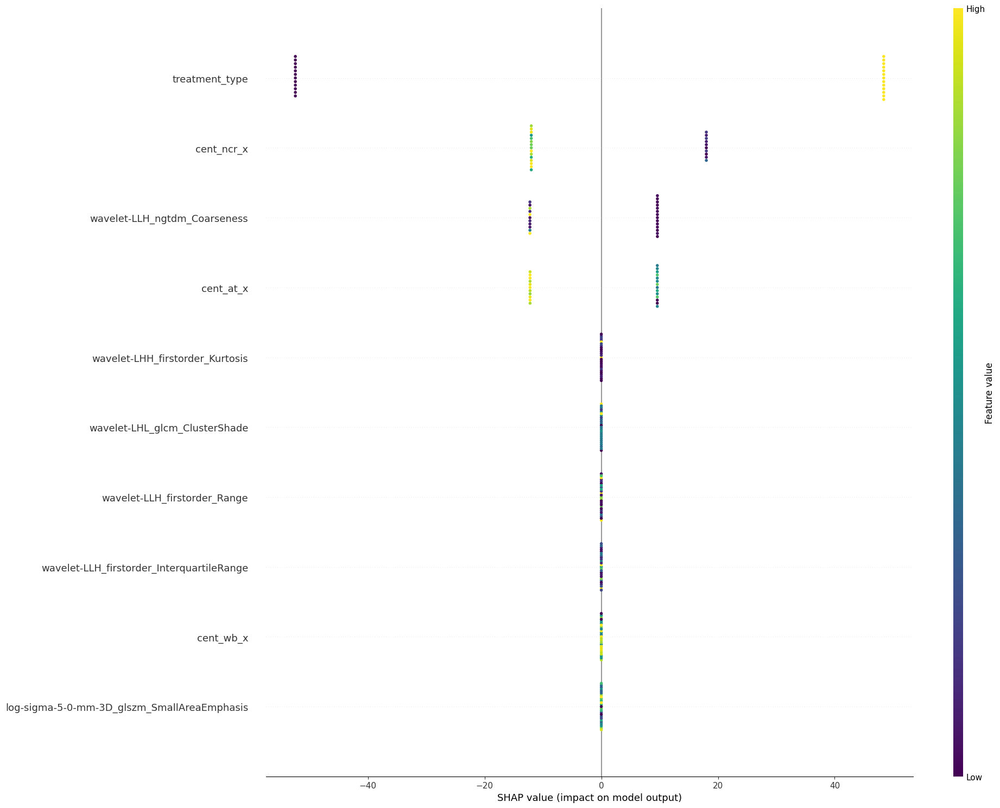

In [ ]:
#!pip install numpy==1.23
import pandas as pd
import matplotlib.pyplot as plt

import shap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

# Read the dataset
df = pd.read_excel('/content/Validation_gene_final_clinical_classification_withgene.xlsx')
print(df.shape)
# Filter out rows with certain conditions
#df = df[df['Survival Days'] != 'ALIVE (361 days later)']
#df = df.fillna(-1)
#df = df[df['Survival Days'] != -1]

# Encoding categorical features
LE = LabelEncoder()
df['gender'] = LE.fit_transform(df['gender'])
df['race'] = LE.fit_transform(df['race'])
df['treatment_type'] = LE.fit_transform(df['treatment_type'])
#print(df['gender'])
# Split into features and target
x_train = df.drop(columns=['ID', 'Survival Days', 'Survival_categories'],axis=1)

y_train = df['Survival Days']
feature=x_train.columns
#print(feature)
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(x_train, y_train, random_state=1, test_size=0.25, shuffle=True)

# Train RandomForestRegressor model
rf_clf = RandomForestRegressor(n_estimators= 40, max_depth= 2, max_features=None, min_samples_leaf=9, random_state=5)
rf_clf.fit(X_train, y_train)
explainer = shap.TreeExplainer(rf_clf,X_train)
#shap_values = explainer(x_train)
shap_values = explainer.shap_values(X_train)
print(shap_values[10])

shap.summary_plot(shap_values, X_train,max_display=10,feature_names=feature,color='red', cmap='viridis',show=False,plot_size=[20,15])
print(f'Size: {plt.gcf().get_size_inches()}')
# Create a SHAP explainer for RandomForestRegressor
#rf_explainer = shap.TreeExplainer(rf_clf)
#rf_shap_values = rf_explainer.shap_values(X_test)
#shap.summary_plot(shap_values, X_train, plot_type="bar")
# Generate the SHAP summary plot for RandomForestRegressor
#shap.summary_plot(rf_shap_values, X_test)


In [ ]:
#Tree explainer working used for IMA journal
!pip install shap
import time
t1 = time.perf_counter()
import shap
import matplotlib.pyplot as plt
explainer = shap.KernelExplainer(clf,X_train)
shap_values = explainer(X_train)
# visualize the first prediction's explanation
#print(X_train[0])
feature=df.columns
print(feature)
df = df.drop(columns=['ID', 'Resection Status','Survival Days'],axis=1)
feature=df.columns

#shap.plots.waterfall(shap_values[0],max_display=29)
#shap.plots.scatter(shap_values[:,"Age"])
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train,max_display=29,feature_names=feature,show=False,cmap='winter',plot_size=[20,15])
print(f'Size: {plt.gcf().get_size_inches()}')
fig, ax = plt.gcf(), plt.gca()

# Modifying main plot parameters
ax.tick_params(labelsize=20)
ax.set_xlabel("SHAP value (impact on model output)", fontsize=20)
# Get colorbar
cb_ax = fig.axes[1]

# Modifying color bar parameters
cb_ax.tick_params(labelsize=20)
cb_ax.set_ylabel("Feature value", fontsize=20)
plt.savefig("shapsum_trainens9modpp_erfr.pdf",dpi=1500, bbox_inches='tight')
t2 = time.perf_counter()
print('time taken to run:',t2-t1)
pyplot.show()

Provided model function fails when applied to the provided data set.


TypeError: 'XGBRegressor' object is not callable

In [ ]:
#training the regressor model with categorical data
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor	# To fit the svm classifier
from sklearn import utils
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing,linear_model
import pandas as pd
import pickle
import numpy as np
import csv
import seaborn as sns
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.feature_selection import RFE, RFECV
from scipy.stats import spearmanr, pearsonr
from matplotlib import pyplot as plt
LE = LabelEncoder()
df = pd.read_excel('/content/sample_data/Validation_gene_final_clinical.xlsx')
#df = df[df['Resection Status'] == 'GTR']
df = df[df['Survival Days'] != 'ALIVE (361 days later)']
df = df.fillna(-1)
df = df[df['Survival Days'] != -1]

# Encoding categorical features
df['gender']= LE.fit_transform(df['gender'])
df['race']= LE.fit_transform(df['race'])
df['treatment_type']= LE.fit_transform(df['treatment_type'])
#print("gender",df['treatment_type'])
x = df.values
x_train = x[:,2:]
#print(x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,1]
y_train=np.float32(y_train) #added for permutation_information

y_train = utils.column_or_1d(y_train.ravel(), warn=True)

param_grid = {
    'n_estimators': [40,45,50,60, 70,75, 80, 100,120],
    'max_features': [None, 'sqrt', 'log2'],#removed 'auto' parameter from here
    'max_depth' : [2,3,4,5,6,7,8,9,10],
    'min_samples_leaf': [2,3,4,6,7,9,10,12],
    'random_state':[0,1,2,5,42]}

##--------------------------------------------------------------------------##
clf=RandomForestRegressor()#ExtraTreesRegressor()
#clf = MLPRegressor(random_state=1, max_iter=800,early_stopping=True)
CV_rfc = GridSearchCV(estimator=clf, param_grid=param_grid, cv= 5,n_jobs=-1)
grid_result=CV_rfc.fit(x_train, y_train)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

In [ ]:
import pandas as pd
from scipy.stats import pearsonr

# Replace 'your_data.csv' with the actual file path
file_path = '/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv'
df = pd.read_csv(file_path)

# Set 'gene_name' column as the index
df.set_index('gene_name', inplace=True)

# Transpose the DataFrame to have features as rows
df_transposed = df.transpose()
#print("df_transposed",df_transposed)
# Calculate the correlation matrix
correlation_matrix = df_transposed.corr()
print("correlation_matrix index",correlation_matrix.index)
# Specify the correlation threshold
threshold = 0.9

# Identify features (rows) with correlation greater than threshold or less than -threshold
high_corr_features = set()

for row in correlation_matrix.index:
    for other_row in correlation_matrix.index:
        #print("row",row)
        #print("other_row",other_row)
        if row != other_row:
            correlation = correlation_matrix.loc[row, other_row]
            print("correlation",correlation)
            if abs(correlation) > threshold:
                high_corr_features.add(row)
                high_corr_features.add(other_row)
print("high_corr_features",high_corr_features)
# high_corr_features=list(high_corr_features)
# Remove high-correlation features (rows) from the original DataFrame
filtered_data_transposed = df_transposed.drop(columns=high_corr_features)
print("filtered_data",filtered_data_transposed)
# Transpose back to have features as columns
filtered_data = filtered_data_transposed.transpose()

# Create a DataFrame to store correlation values between remaining features
result_df = pd.DataFrame(index=filtered_data.index, columns=filtered_data.index)

# Calculate correlation values between remaining features
for row in result_df.index:
    for other_row in result_df.index:
        if row != other_row:
            correlation = correlation_matrix.loc[row, other_row]
            result_df.loc[row, other_row] = correlation

# Write the remaining features with their respective correlation values to a new CSV file
result_df.to_csv('remaining_features_with_correlation.csv', sep='\t',index=False)

print("Highly correlated features removed. Remaining features with correlation values written to 'remaining_features_with_correlation.csv'.")



In [ ]:
import csv
from openpyxl import Workbook
wb=Workbook()
ws = wb.active
with open('filtered_features_with_correlation.csv','r') as f:
    for row in csv.reader(f):
        ws.append(row)
wb.save('filtered_features_with_correlation.xlsx')

In [ ]:
#working
import pandas as pd
from scipy.stats import pearsonr
import pandas as pd
import numpy as np

# Replace 'your_data.csv' with the actual file path
file_path = '/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv'
df = pd.read_csv(file_path)


# Set 'gene_name' column as the index
df.set_index('gene_name', inplace=True)

# Transpose the DataFrame to have features as rows

df_transposed = df.transpose()
#print(df_transposed)
# Calculate the correlation matrix
correlation_matrix = df_transposed.corr()
#print("correlation_matrix",correlation_matrix)
# Assuming df_transposed is your transposed DataFrame

threshold = 0.5

# Create a mask for the correlation values that meet the threshold
mask = np.abs(correlation_matrix) <= threshold

# Apply the mask to the correlation matrix, setting values outside the threshold to NaN
filtered_correlation_matrix = correlation_matrix.where(mask)
print("filtered_correlation_matrix",filtered_correlation_matrix)

# Create a DataFrame to store feature names and their respective correlation values
result_df = pd.DataFrame(index=correlation_matrix.index, columns=['Feature'] + list(correlation_matrix.index))

# Populate the DataFrame with feature names and their respective correlation values
for feature in correlation_matrix.index:
    result_df.loc[feature, 'Feature'] = feature
    #result_df.loc[feature, correlation_matrix.index] = correlation_matrix.loc[feature, :].where(mask.loc[feature, :])
    result_df.loc[feature, correlation_matrix.index] = filtered_correlation_matrix.loc[feature, :].values


# Write the result DataFrame to a CSV file
result_df.to_csv('filter.csv', sep='\t', index=False, na_rep='NaN')
# Write the result DataFrame to a CSV file
result_df.to_csv('filtered.csv', sep='\t', index=False)






In [ ]:
#generate pearson and spearman correlation between radiomics features (excel) and genes (another excel)
#removed BraTS20_Training_278 from gene excel and it is not there in genes features excel
import pandas as pd
import numpy as np
import csv
from scipy.stats import spearmanr, pearsonr



# Assuming your CSV file is correctly formatted with the gene names in the first column
#df = pd.read_csv('/content/GENE.csv',index_col=0)
df = pd.read_excel('/content/reduced_gene_dataset.xlsx',index_col=0)
print(df.shape)
df_reduced = df.drop(columns=['BraTS20_Training_278'])

print(df_reduced.shape)
# Transpose the DataFrame to have genes as rows
df_transposed = df_reduced.transpose()
print("transpose",df_transposed.shape)
x_gene = df_transposed.iloc[:, :].values
#print("x_train",x_train)
count = 0

df_radio = pd.read_excel('/content/reduced_radiomic_features.xlsx',index_col=0)
print("df_radio",df_radio.columns)
print("df_radio",df_radio.shape)
df_radio1 = df_radio.drop(columns=['Resection Status'])
x_radio = df_radio1.iloc[:, :].values

with open('radio_geneomics.csv', 'w') as f:
    w = csv.DictWriter(f,["column1","column2","pearson_coef","spearman_coef"])
    w.writeheader()
    for i in range(0, x_gene.shape[1]):
        for j in range(0, x_radio.shape[1]):
            #print(x_radio[:,j])
            coef, p= pearsonr(x_gene[:,i], x_radio[:,j])
            coef_spearman, p_spearman = spearmanr(x_gene[:,i], x_radio[:,j])
            #if (abs(coef_spearman)>=0.7):
            count += 1
            print('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_radio1.columns[j], coef, coef_spearman))
            f.write('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_radio1.columns[j], coef, coef_spearman))


print("Total comparisons:", count)



Streaming output truncated to the last 5000 lines.

BID, log-sigma-4-0-mm-3D_glcm_SumAverage, -0.069, 0.109

BID, log-sigma-4-0-mm-3D_glcm_JointEntropy, 0.078, 0.088

BID, log-sigma-3-0-mm-3D_firstorder_Energy, 0.068, 0.095

BID, log-sigma-2-0-mm-3D_firstorder_Kurtosis, 0.109, 0.084

BID, log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis, -0.018, 0.154

BID, log-sigma-3-0-mm-3D_gldm_LowGrayLevelEmphasis, -0.095, -0.141

BID, log-sigma-4-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis, -0.079, 0.040

BID, log-sigma-2-0-mm-3D_glrlm_HighGrayLevelRunEmphasis, -0.044, 0.144

BID, log-sigma-5-0-mm-3D_glszm_SmallAreaEmphasis, -0.010, -0.096

SLC30A9, Survival Days, -0.105, -0.062

SLC30A9, Age, -0.229, -0.229

SLC30A9, cent_ncr_x, 0.152, 0.119

SLC30A9, cent_at_x, -0.174, -0.045

SLC30A9, cent_wb_x, -0.149, -0.004

SLC30A9, wavelet-LLH_firstorder_InterquartileRange, 0.144, 0.110

SLC30A9, wavelet-LLH_firstorder_Range, 0.326, 0.442

SLC30A9, wavelet-LLH_ngtdm_Coarseness, -0.270, -0.229

SLC

4476


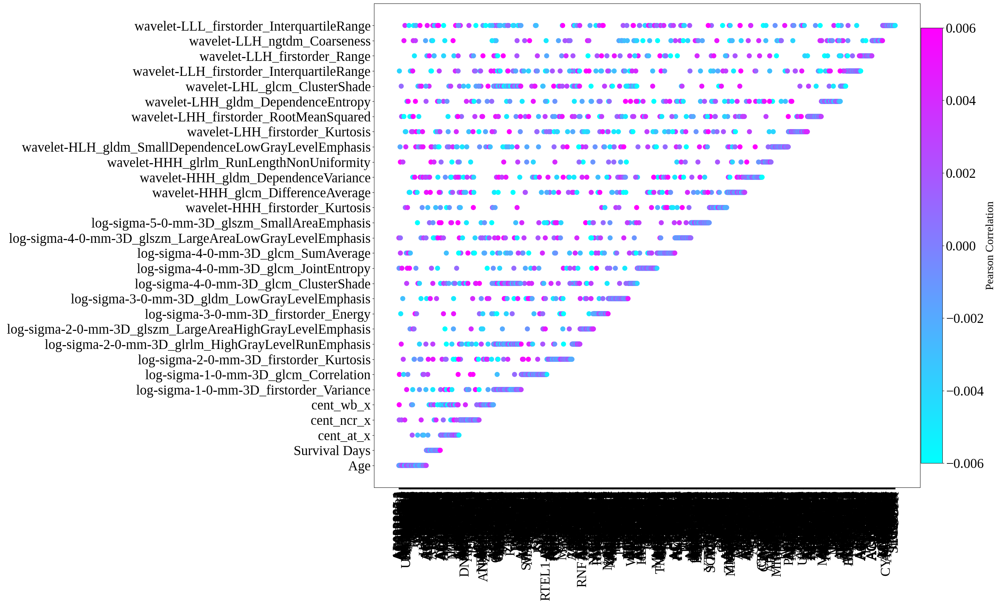

In [ ]:
#final and working scatterplot th7 and th005
import matplotlib.pyplot as plt
import pandas as pd
#here the features have threshold value >=0.7
# Read data from Excel file
#df = pd.read_csv('/content/cor_pearson_radio_gene_th7_final.csv')#threshold value >=0.7
df = pd.read_excel('/content/corr_pearson_radiogenomicsth005_final.xlsx')
#df = pd.read_excel('/content/cor_pearson_radio_gene_th7_final.xlsx')#threshold 0.005
#df = df.iloc[1:]
# Assuming your Excel file has columns named 'Feature1', 'Feature2', and 'Correlation'
features1 = df['column1']
features2 = df['column2']
pearson_correlation = df['pearson_coef']
print(features1.shape[0])
len=features1.shape[0]/2
zipped_data = zip(features1, features2, pearson_correlation)
sorted_data = sorted(zipped_data, key=lambda x: x[1])
plt.rcParams.update({'font.size': 28, 'font.family': 'Liberation Serif'})
# Unzip the sorted data
sorted_features = list(zip(*sorted_data))
# Plotting
plt.figure(figsize=(30,18))
plt.scatter(sorted_features[0], sorted_features[1], c=sorted_features[2], cmap='cool', s=90)
colorbar=plt.colorbar(label='Pearson Correlation',shrink=0.9,pad=0.001)
colorbar.set_label(label='Pearson Correlation', fontsize=23, fontname='Liberation Serif')


# for label in colorbar.ax.yaxis.get_ticklabels():
#     label.set_fontsize(10)
#     label.set_fontname('Liberation Serif')
#plt.xlabel('Gene Data',fontname='Liberation Serif', fontsize=28)
#plt.ylabel('Radiomics Features',fontname='Liberation Serif', fontsize=28)
plt.gca().set_xticks(plt.gca().get_xticks()[::2])#slicing 3 used for th0.7, slicing 100 is used for th005

plt.xticks(rotation=90, fontsize=28, fontname='Liberation Serif')
plt.yticks(fontsize=28, fontname='Liberation Serif')


#plt.grid(True)
plt.tight_layout()
plt.savefig('scatterplot_005_finalv.pdf', dpi=900,bbox_inches='tight')
plt.show()

#244 gene information and 16 radiomics features
#4476 gene information for threshold value

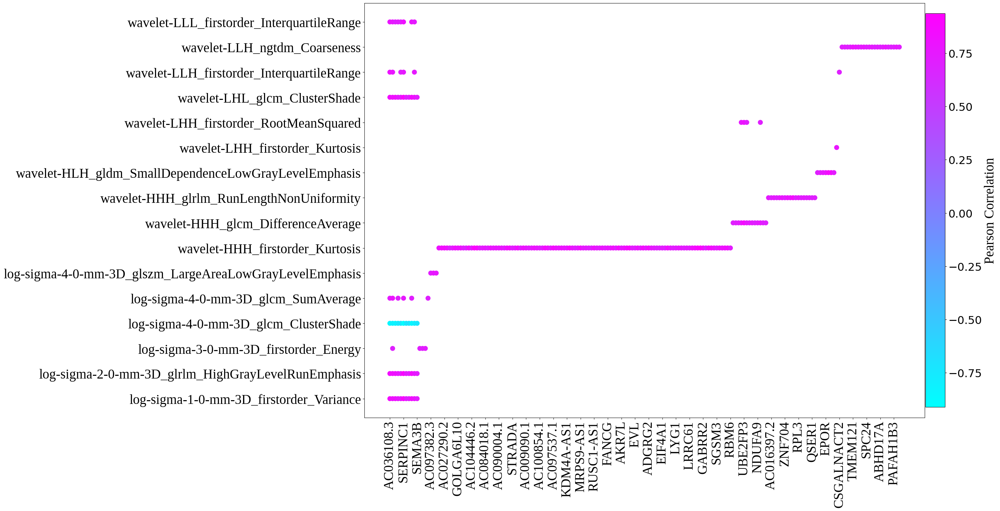

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Read data from Excel file
df = pd.read_excel('/content/cor_pearson_radio_gene_th7_final.xlsx')

# Extracting features and correlation data
features1 = df['column1']
features2 = df['column2']
pearson_correlation = df['pearson_coef']

# Sorting the data based on features2
sorted_data = sorted(zip(features1, features2, pearson_correlation), key=lambda x: x[1])

# Unzip the sorted data
sorted_features = list(zip(*sorted_data))

# Plotting
plt.figure(figsize=(30,15))
plt.scatter(sorted_features[0], sorted_features[1], c=sorted_features[2], cmap='cool', s=90)
colorbar=plt.colorbar(label='Pearson Correlation',shrink=0.95,pad=0.001)
colorbar.set_label(label='Pearson Correlation', fontsize=28, fontname='Liberation Serif')

#plt.xlabel('Gene Data', fontname='Liberation Serif', fontsize=28)
#plt.ylabel('Radiomics Features', fontname='Liberation Serif', fontsize=28)
plt.gca().set_xticks(plt.gca().get_xticks()[::5])
# Adjusting ticks
plt.xticks(rotation=90, fontsize=28, fontname='Liberation Serif')
plt.yticks(fontsize=28, fontname='Liberation Serif')
colorbar.ax.tick_params(labelsize=23)

# Save and display plot
plt.tight_layout()
plt.savefig('scatterplot_007_finalv.pdf', dpi=1000, bbox_inches='tight')
plt.show()


108


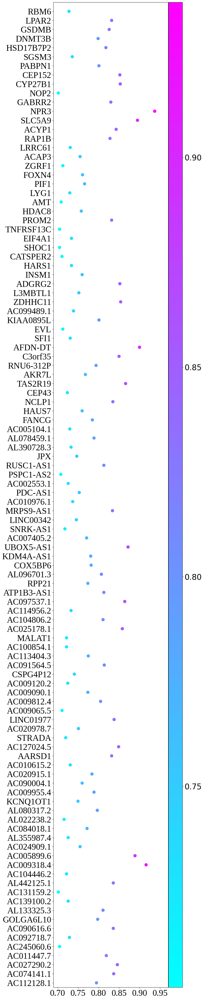

In [ ]:
#generating heatmap/scatterplot for specific feature class
#FOK gene
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Read data from Excel file
df = pd.read_excel('/content/cor_pearson_radio_gene_th7_FOK_new.xlsx')

# Extracting features and correlation data
features1 = df['column1']
features2 = df['column2']
pearson = df['pearson_coef']

print(len(features1))

# Plotting

plt.figure(figsize=(9, 45))
scatter= plt.scatter(pearson,features1, c=pearson, cmap='cool',s=90)
#plt.xlabel('Numeric Value')
#plt.ylabel('Feature Name')
plt.xticks(fontsize=28, fontname='Liberation Serif')#rotation=90,
plt.yticks(fontsize=28, fontname='Liberation Serif')
#plt.title('Scatter Plot of Numeric Values and Feature Names')
#plt.grid(True)
plt.xlim(0.69, 0.97)
plt.ylim(-0.5, len(features1))

colorbar=plt.colorbar(scatter,pad=0.001,aspect=70)#shrink=0.99
colorbar.ax.tick_params(labelsize=25)

# Save and display plot
plt.tight_layout()
plt.savefig('scatterplot_007_FOK1.pdf', dpi=900, bbox_inches='tight')
plt.show()


18


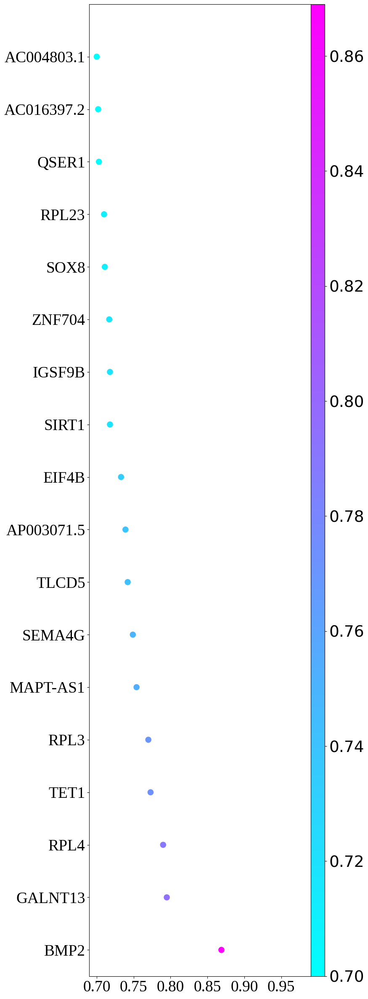

In [ ]:
#generating heatmap/scatterplot for specific feature class
#course and RLNU gene
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Read data from Excel file
#df = pd.read_excel('/content/coarseness.xlsx')
df = pd.read_excel('/content/RLNU.xlsx')

# Extracting features and correlation data
features1 = df['column1']
features2 = df['column2']
pearson = df['pearson_coef']

print(len(features1))

# Plotting
plt.figure(figsize=(8, 30))
scatter= plt.scatter(pearson,features1, c=pearson, cmap='cool',s=90)
#plt.xlabel('Numeric Value')
#plt.ylabel('Feature Name')
plt.xticks(fontsize=27, fontname='Liberation Serif')
plt.yticks(fontsize=27, fontname='Liberation Serif')
#plt.title('Scatter Plot of Numeric Values and Feature Names')
#plt.grid(True)
#plt.xlim(-0.5, len(features1))
plt.xlim(0.69, 0.99)
plt.ylim(-0.5, len(features1))

colorbar=plt.colorbar(scatter,aspect=70,pad=0.001)
colorbar.ax.tick_params(labelsize=27)

# Save and display plot
#plt.tight_layout()
plt.savefig('scatterplot_007_VRLNU.pdf', dpi=900, bbox_inches='tight')
plt.show()


174870


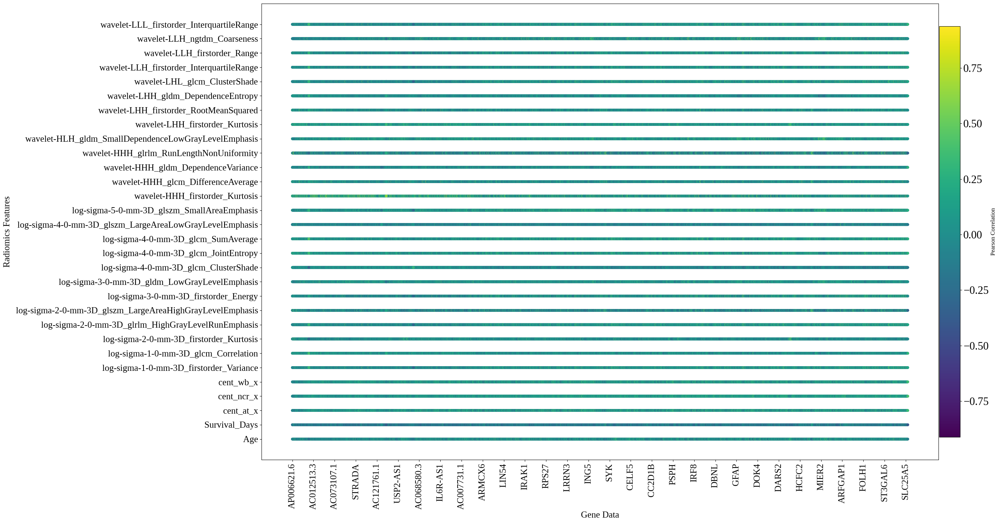

In [ ]:
#final and working scatterplot th7 and th005 and entire dataset (radiogenomics)
import matplotlib.pyplot as plt
import pandas as pd
#here the features have threshold value >=
# Read data from Excel file
#df = pd.read_csv('/content/cor_pearson_radio_gene_th7_final.csv')#threshold value >=0.7
#df = pd.read_excel('/content/corr_pearson_radiogenomicsth005_final.xlsx')#threshold 0.005
df = pd.read_csv('/content/radio_geneomics.csv')
#df = df.iloc[1:]
# Assuming your Excel file has columns named 'Feature1', 'Feature2', and 'Correlation'
features1 = df['column1']
features2 = df['column2']
pearson_correlation = df['pearson_coef']
print(features1.shape[0])#174870 for radiogenomics dataset
len=features1.shape[0]/2
zipped_data = zip(features1, features2, pearson_correlation)
sorted_data = sorted(zipped_data, key=lambda x: x[1])
plt.rcParams.update({'font.size': 22, 'font.family': 'Liberation Serif'})
# Unzip the sorted data
sorted_features = list(zip(*sorted_data))
# Plotting
plt.figure(figsize=(30,15))
plt.scatter(sorted_features[0], sorted_features[1], c=sorted_features[2], cmap='viridis', s=20)
colorbar=plt.colorbar(label='Pearson Correlation',shrink=0.9,pad=0.001)
colorbar.set_label(label='Pearson Correlation', fontsize=12, fontname='Liberation Serif')


# for label in colorbar.ax.yaxis.get_ticklabels():
#     label.set_fontsize(10)
#     label.set_fontname('Liberation Serif')
plt.xlabel('Gene Data',fontname='Liberation Serif', fontsize=18)
plt.ylabel('Radiomics Features',fontname='Liberation Serif', fontsize=18)
plt.gca().set_xticks(plt.gca().get_xticks()[::200])#slicing 3 used for th0.7, slicing 100 is used for th005
plt.xticks(rotation=90, fontsize=18, fontname='Liberation Serif')
plt.yticks(fontsize=18, fontname='Liberation Serif')


#plt.grid(True)
plt.tight_layout()
plt.savefig('scatterplot_radiogenomics.pdf', dpi=700,bbox_inches='tight')
plt.show()

#244 gene information and 16 radiomics features
#4476 gene information for threshold value

34
counts [689144    241    104     75     41     20     12      9      8      2]
bins [0.0004 5847.86837 11695.736340000001 17543.604310000002 23391.47228
 29239.34025 35087.20822 40935.07619 46782.94416 52630.81213 58478.6801]


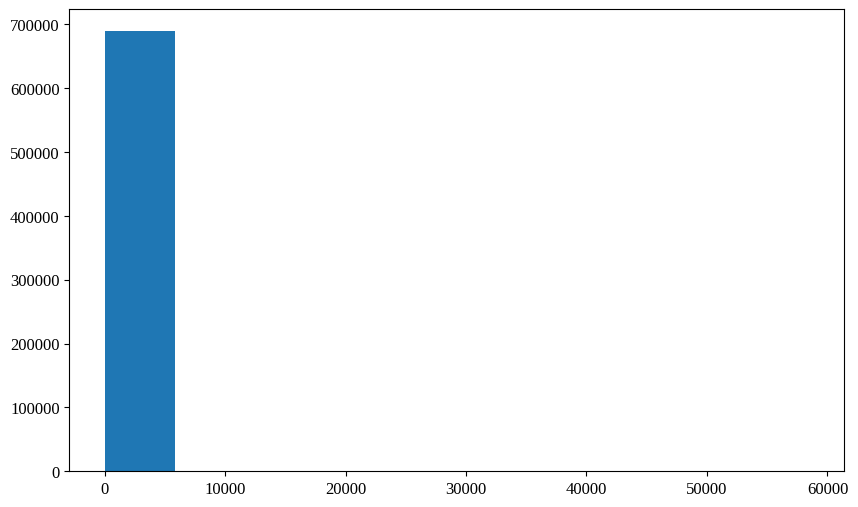

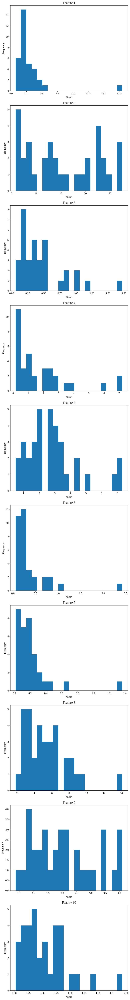

"\n# Create subplots for each feature\nnum_features = len(features)\nnum_plots = num_features // 10000 + (1 if num_features % 10000 != 0 else 0)\nfig, axes = plt.subplots(num_plots, 1, figsize=(10, 3 * num_plots))\n\n# Plot histograms for every 5000 features with different colors\nfor i in range(0, num_features, 10000):\n    feature_subset = features[i:i+10000]\n    ax = axes[i // 10000] if num_plots > 1 else axes\n    for j, feature in enumerate(feature_subset):\n        color = cmap(j % cmap.N)  # Get the color from the colormap\n        data_values = df_transposed[feature].tolist()  # Convert column data to list\n        ax.hist(data_values, bins=20, color=color, edgecolor='black', alpha=0.7, label=feature)\n    ax.set_xlabel('Value')\n    ax.set_ylabel('Frequency')\n    ax.set_title(f'Histograms of Features {i+1} to {min(i+10000, num_features)}')\n    ax.legend()\n\n#plt.tight_layout()\nplt.savefig('histograms_multiple_features.pdf', dpi=800)\nplt.show()\n"

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Read data from CSV file
#df = pd.read_csv('/content/filtered_output_filev5.csv')
df = pd.read_csv('/content/drive/MyDrive/brats_gene/filtered_output_filev5.csv')
#print(df.columns)
df_transpose=df.transpose()
#print("transpose",df_transpose.columns)
# Read the CSV file
feature=df_transpose.iloc[1:,]
feature1 = df_transpose.iloc[1:, 14367]
print(len(feature))
#print("feature",df_transpose.iloc[0:1, 2660])
feature2 = df_transpose.iloc[1:, 9171]
feature3 = df_transpose.iloc[1:, 2660]

# Plot histograms for the three features
plt.figure(figsize=(10, 6))
counts, bins = np.histogram(feature)
print("counts",counts)
print("bins",bins)
plt.hist(bins[:-1], bins, weights=counts)

#plt.hist(feature, bins=20,alpha=0.5)
# plt.hist(feature1, bins=20, color='green',alpha=0.5, label='IMPA1')
# plt.hist(feature2, bins=20, color='blue', alpha=0.5, label='PTEN')
# plt.hist(feature3, bins=20, color='#FFB6C1', alpha=0.5, label='C17orf100')

num_features_to_plot = 10
fig, axes = plt.subplots(num_features_to_plot, 1, figsize=(8, 6*num_features_to_plot))
for i in range(num_features_to_plot):
    axes[i].hist(df_transpose.iloc[1:, i], bins=20)
    axes[i].set_title(f'Feature {i+1}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')
plt.tight_layout()
plt.show()
"""
plt.xlabel('Gene Value')
plt.ylabel('Frequency')
#plt.gca().set_xticks(plt.gca().get_xticks()[::200])
#plt.title('Histograms of Three Features')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("histogram_datav5.pdf",dpi=800, bbox_inches='tight')
plt.show()
"""

# Update font settings

"""
# Create subplots for each feature
num_features = len(features)
num_plots = num_features // 10000 + (1 if num_features % 10000 != 0 else 0)
fig, axes = plt.subplots(num_plots, 1, figsize=(10, 3 * num_plots))

# Plot histograms for every 5000 features with different colors
for i in range(0, num_features, 10000):
    feature_subset = features[i:i+10000]
    ax = axes[i // 10000] if num_plots > 1 else axes
    for j, feature in enumerate(feature_subset):
        color = cmap(j % cmap.N)  # Get the color from the colormap
        data_values = df_transposed[feature].tolist()  # Convert column data to list
        ax.hist(data_values, bins=20, color=color, edgecolor='black', alpha=0.7, label=feature)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.set_title(f'Histograms of Features {i+1} to {min(i+10000, num_features)}')
    ax.legend()

#plt.tight_layout()
plt.savefig('histograms_multiple_features.pdf', dpi=800)
plt.show()
"""


transpose RangeIndex(start=0, stop=20284, step=1)


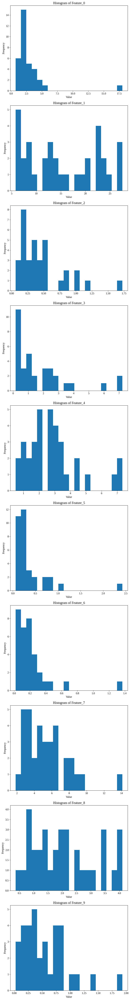

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'data' is your dataset with shape (34, 20284)
# Generate random data for demonstration
df = pd.read_csv('/content/drive/MyDrive/brats_gene/filtered_output_filev5.csv')
feature_names = [f'Feature_{i}' for i in range(len(df.columns))]

# Assign feature names to the DataFrame
df.columns = feature_names
#print(df.columns)
df_transpose=df.transpose()
print("transpose",df_transpose.columns)
# Read the CSV file
data=df_transpose.iloc[1:,]

# Plot histograms for a subset of features (e.g., first 10 features)
num_features_to_plot = 10
fig, axes = plt.subplots(num_features_to_plot, 1, figsize=(8, 6*num_features_to_plot))
for i in range(num_features_to_plot):
    feature_name = df.columns[i]  # Get the name of the feature from the column name
    axes[i].hist(df_transpose.iloc[1:, i], bins=20)
    axes[i].set_title(f'Histogram of {feature_name}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')
plt.tight_layout()
plt.show()


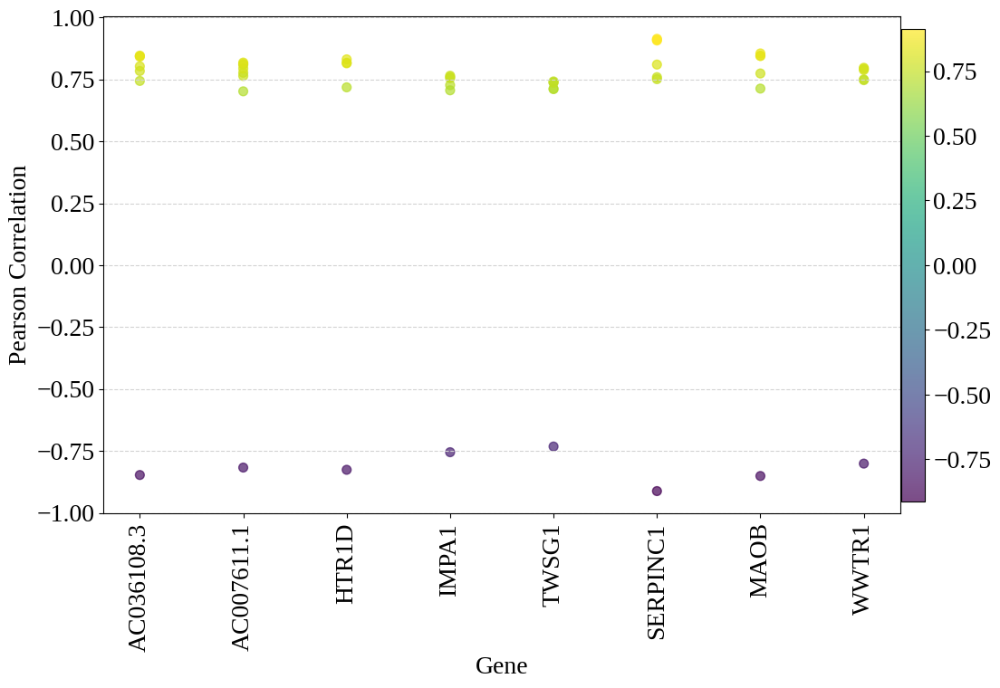

In [ ]:
#common genes in all the radiomics group
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the CSV file
df = pd.read_excel('/content/cor_pearson_radio_gene_th7_final.xlsx')

# Group the data by radiomic features (column2)
grouped = df.groupby('column2')

# Initialize an empty set to store common genes
common_genes = set()

# Iterate over each radiomic group
for name, group in grouped:
    #print(name,group)
    # Extract genes associated with the current radiomic group
    genes_in_group = set(group['column1'])
    #print("genes_in_group",genes_in_group)
    # If it's the first group, initialize common_genes with genes from the first group
    if len(common_genes) == 0:
        common_genes = genes_in_group
    else:
        # Take the intersection of genes_in_group with common_genes to find common genes
        common_genes = common_genes.intersection(genes_in_group)

# Filter the DataFrame to include only rows corresponding to common genes
common_genes_data = df[df['column1'].isin(common_genes)]

# Create lists to store gene names and their respective Pearson correlation values
genes = []
pearson_values = []
plt.rcParams.update({'font.size': 20, 'font.family': 'Liberation Serif'})
# Iterate over the filtered DataFrame and populate the lists
for index, row in common_genes_data.iterrows():
    gene = row['column1']
    pearson_value = row['pearson_coef']
    genes.append(gene)
    pearson_values.append(pearson_value)

# Plot the scatter plot
plt.figure(figsize=(12, 8))
scatter = plt.scatter(genes, pearson_values, s=50, c=pearson_values, cmap='viridis', alpha=0.7)
plt.xlabel('Gene')
plt.ylabel('Pearson Correlation')
#plt.title('Scatter Plot of Common Genes and their Pearson Correlation Values')
plt.xticks(rotation=90)  # Rotate x-axis labels by 45 degrees
plt.grid(axis='y', linestyle='--', color='lightgray')

# Add color bar
cbar = plt.colorbar(scatter, shrink=0.95, pad=0.001)
#cbar.set_label('Pearson Correlation')

plt.tight_layout()
plt.savefig("common_gene_th005.pdf", dpi=900, bbox_inches='tight')
plt.show()


<ipython-input-150-573d22255bc3>:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 1000x600 with 0 Axes>

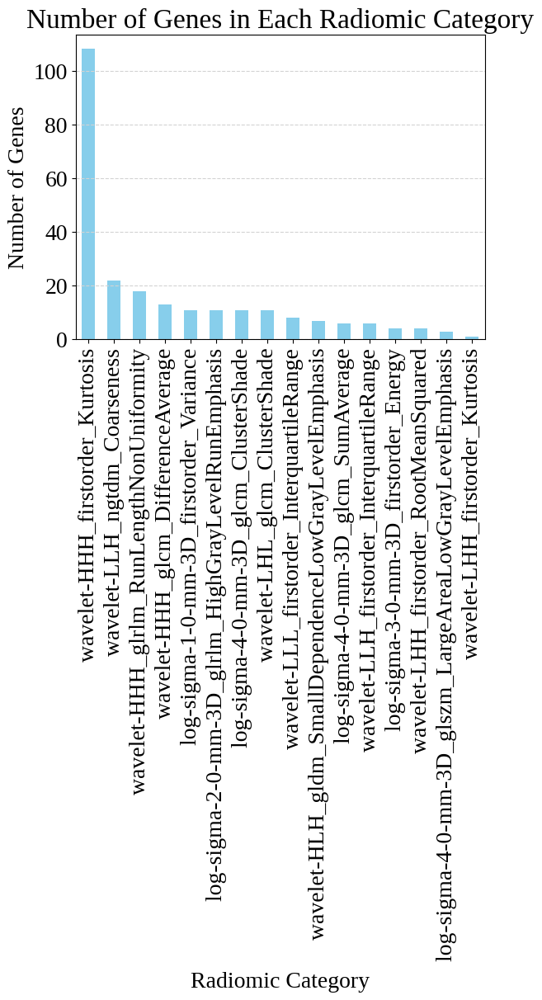

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
df = pd.read_csv('/content/cor_pearson_radio_gene_th7_final.csv')

# Group the data by radiomic features (column2)
grouped = df.groupby('column2')

# Initialize a dictionary to store the count of genes in each radiomic category
gene_counts = {}

# Iterate over each radiomic group
for name, group in grouped:
    # Count the unique genes in the current radiomic group
    unique_genes_count = len(group['column1'].unique())

    # Store the count in the gene_counts dictionary
    gene_counts[name] = unique_genes_count

# Convert the dictionary to a DataFrame for easier plotting
gene_counts_df = pd.DataFrame.from_dict(gene_counts, orient='index', columns=['Gene Count'])

# Plot the bar plot
plt.figure(figsize=(10, 6))
gene_counts_df.sort_values(by='Gene Count', ascending=False).plot(kind='bar', color='skyblue', legend=None)
plt.xlabel('Radiomic Category')
plt.ylabel('Number of Genes')
plt.title('Number of Genes in Each Radiomic Category')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', color='lightgray')
plt.tight_layout()
plt.show()


<ipython-input-189-df918b3d9da8>:46: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


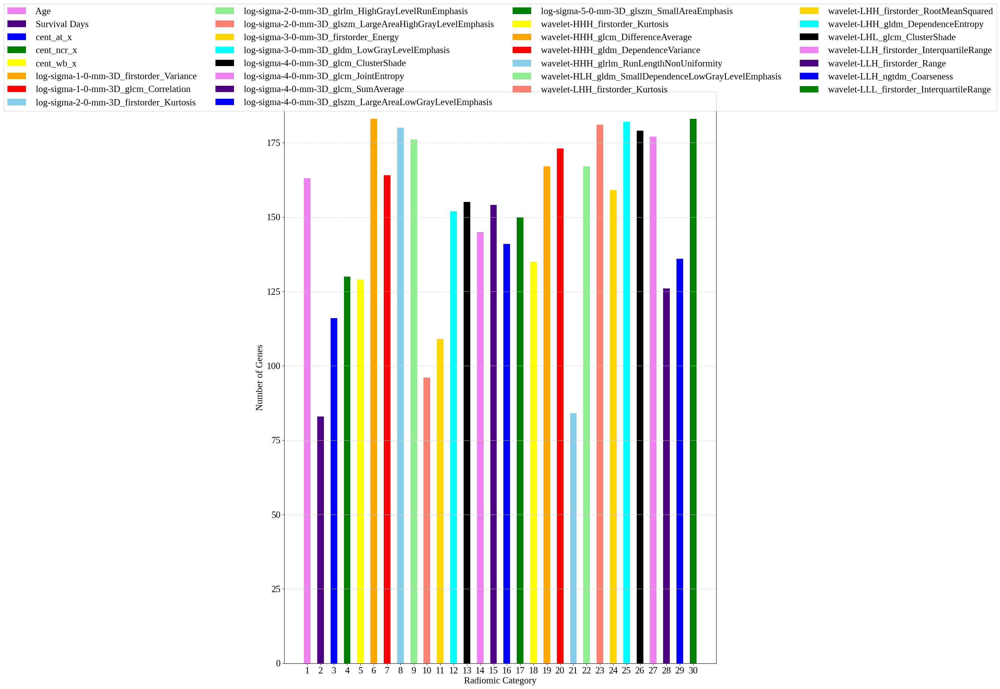

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Read the CSV file
df = pd.read_excel('/content/corr_pearson_radiogenomicsth005_final.xlsx')

# Group the data by radiomic features (column2)
grouped = df.groupby('column2')

# Initialize a list to store the count of genes in each radiomic category
gene_counts_list = []
plt.rcParams.update({'font.size': 20, 'font.family': 'Liberation Serif'})
# Assign colors to each radiomic category
colors = ['violet','indigo', 'blue', 'green', 'yellow','orange', 'red', 'skyblue', 'lightgreen', 'salmon', 'gold', 'cyan','black']  # Add more colors if needed

# Iterate over each radiomic group
for name, group in grouped:
    # Count the unique genes in the current radiomic group
    unique_genes_count = len(group['column1'].unique())

    # Store the count in the gene_counts_list
    gene_counts_list.append((name, unique_genes_count))
plt.rcParams.update({'font.size': 18, 'font.family': 'Liberation Serif'})
# Plot the bar plot with different colors for each radiomic category
plt.figure(figsize=(15,20))
legend_patches = []  # List to store legend patches
width = 0.5  # Width of each bar

for i, (name, count) in enumerate(gene_counts_list):
    color = colors[i % len(colors)]  # Cycle through colors if more categories than colors
    plt.bar(i, count, color=color, label=name, width=width)

    # Add color patches for legend
    legend_patches.append(Patch(color=color, label=name))

# Add legend with color representation
plt.legend(ncol=4, loc='center', bbox_to_anchor=(0.5, 1.06))
#plt.legend(loc='upper right',handles=legend_patches, title='Radiomic Category',fontsize=12)
plt.xlabel('Radiomic Category')
plt.ylabel('Number of Genes')
#plt.title('Number of Genes in Each Radiomic Category')
#plt.xticks(range(len(gene_counts_list)), [name for name, _ in gene_counts_list], rotation=90)
plt.xticks(range(len(gene_counts_list)), range(1, len(gene_counts_list) + 1))
plt.grid(axis='y', linestyle='--', color='lightgray')
plt.tight_layout()
plt.savefig("geneineachcat_th005.pdf", dpi=800, bbox_inches='tight')
plt.show()


AP006621.6
7288


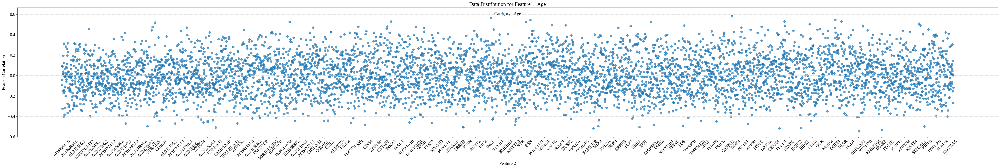

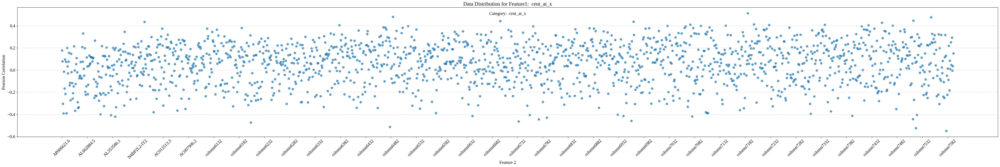

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Assuming you have your DataFrame df containing feature1, feature2, and pearson correlation
# df = ...
df = pd.read_excel('/content/Book1_.xlsx')
# Extracting the columns
features1 = df['column1']
features2 = df['column2']
pearson_correlation = df['pearson_coef']
print(features1[0])
"""
plt.figure(figsize=(8, 6))
sns.boxplot(y='pearson_coef', data=df)
plt.title('Distribution of Pearson Correlation')
plt.ylabel('Pearson Correlation')
plt.show()


# Compare Pearson Correlation across categories of Feature1
plt.figure(figsize=(40, 6))
sns.boxplot(x='column1', y='pearson_coef', data=df)
plt.title('Comparison of Pearson Correlation across Feature1 Categories')
plt.xlabel('Feature1')
plt.ylabel('Pearson Correlation')
plt.xticks(rotation=45)
plt.show()
"""
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...

# Group the data by feature1 categories
grouped = df.groupby('column2')
import matplotlib.pyplot as plt
num_unique_labels = df['column1'].nunique()
print(num_unique_labels)
plt.rcParams.update({'font.size': 15, 'font.family': 'Liberation Serif'})

# Plot the data for each feature1 category
for name, group in grouped:
    plt.figure(figsize=(60, 8))
    plt.scatter(group['column1'], group['pearson_coef'],s=50,alpha=0.70)
    plt.xlabel('Feature 2')
    plt.ylabel('Pearson Correlation')
    plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
    plt.title(f'Data Distribution for Feature1: {name}')
    plt.gca().set_xticks(plt.gca().get_xticks()[::50])

    # Add a text annotation for the category name
    plt.text(0.5, 0.95, f'Category: {name}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

    plt.grid(axis='y', linestyle='--', color='lightgray')
    plt.show()
    #plt.title(f'Data Distribution for Feature1: {name}')
    #plt.grid(axis = 'y',linestyle="--", color='lightgray')
    #plt.tight_layout()
    #plt.show()



In [ ]:
#working code used to groupby radiomics

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...
#df = pd.read_excel('/content/Book1_.xlsx')
df = pd.read_csv('/content/radio_geneomics.csv')

# Group the data by column2 categories
grouped = df.groupby('column2')
labels_dict = {}

# Update font settings
plt.rcParams.update({'font.size': 15, 'font.family': 'Liberation Serif'})

# Plot the data for each column2 category
for name, group in grouped:
    x_labels = group['column1'].tolist()
    pearson_coef = group['pearson_coef'].tolist()

    # Ensure both arrays have the same length
    max_len = max(len(x_labels), len(pearson_coef))
    x_labels += [np.nan] * (max_len - len(x_labels))
    pearson_coef += [np.nan] * (max_len - len(pearson_coef))

    # Store x-axis labels in the dictionary
    labels_dict[name] = {'column1': x_labels}

    # Plot the data
    plt.figure(figsize=(30, 6))
    plt.scatter(x_labels, pearson_coef, s=25, alpha=0.8)
    plt.xlabel('Gene')
    plt.ylabel('Pearson Correlation')
    plt.title(f'Data Distribution for : {name}')
    plt.gca().set_xticks(plt.gca().get_xticks()[::100])
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', color='lightgray')

    # Save the plot
    plot_file_name = f'plot_for_group_{name}.pdf'
    plt.savefig(plot_file_name, bbox_inches='tight', dpi=700)
    print(f'Plot for group {name} saved as {plot_file_name}')
    plt.show()

# Create DataFrame and CSV file
labels_df = pd.DataFrame(labels_dict).transpose()
labels_df.to_csv('group_labels_radiogenome.csv', index_label='group_name')
print('Group labels written to group_labels.csv')


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!rm -rf /content/*.pdf

In [ ]:
#final version
#showing distribution of genes and radiomics with colormap
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...
df = pd.read_csv('/content/radio_geneomics.csv')

# Group the data by column2 categories
grouped = df.groupby('column2')
labels_dict = {}

# Update font settings
plt.rcParams.update({'font.size': 24, 'font.family': 'Liberation Serif'})

# Plot the data for each column2 category
for name, group in grouped:
    x_labels = group['column1'].tolist()
    pearson_coef = group['pearson_coef'].tolist()

    # Ensure both arrays have the same length
    max_len = max(len(x_labels), len(pearson_coef))
    x_labels += [np.nan] * (max_len - len(x_labels))
    pearson_coef += [np.nan] * (max_len - len(pearson_coef))


    # Store x-axis labels in the dictionary
    labels_dict[name] = x_labels

    # Define colors based on absolute value of Pearson coefficient
    colors = pearson_coef#[abs(c) for c in pearson_coef]

    # Plot the data with colors based on absolute value of Pearson coefficient
    plt.figure(figsize=(30, 10))
    plt.scatter(x_labels, pearson_coef, c=colors, cmap='viridis', s=25, alpha=0.8)
    plt.xlabel('Gene')
    plt.ylabel('Pearson Correlation')
    plt.title(f'Data Distribution for : {name}')
    plt.xticks(rotation=90)
    plt.gca().set_xticks(plt.gca().get_xticks()[::100])


    plt.colorbar(label='Pearson Coefficient',shrink=0.7,pad=0.001)
    plt.grid(axis='y', linestyle='--', color='lightgray')

    # Save the plot
    plot_file_name = f'plot_for_group_{name}.pdf'
    plt.savefig(plot_file_name, bbox_inches='tight', dpi=700)
    print(f'Plot for group {name} saved as {plot_file_name}')
    plt.show()

# Create DataFrame and CSV file
labels_df = pd.DataFrame(labels_dict)
labels_df.to_csv('group_labels_colormap.csv', index_label='group_name')
print('Group labels written to group_labels.csv')


Output hidden; open in https://colab.research.google.com to view.

16


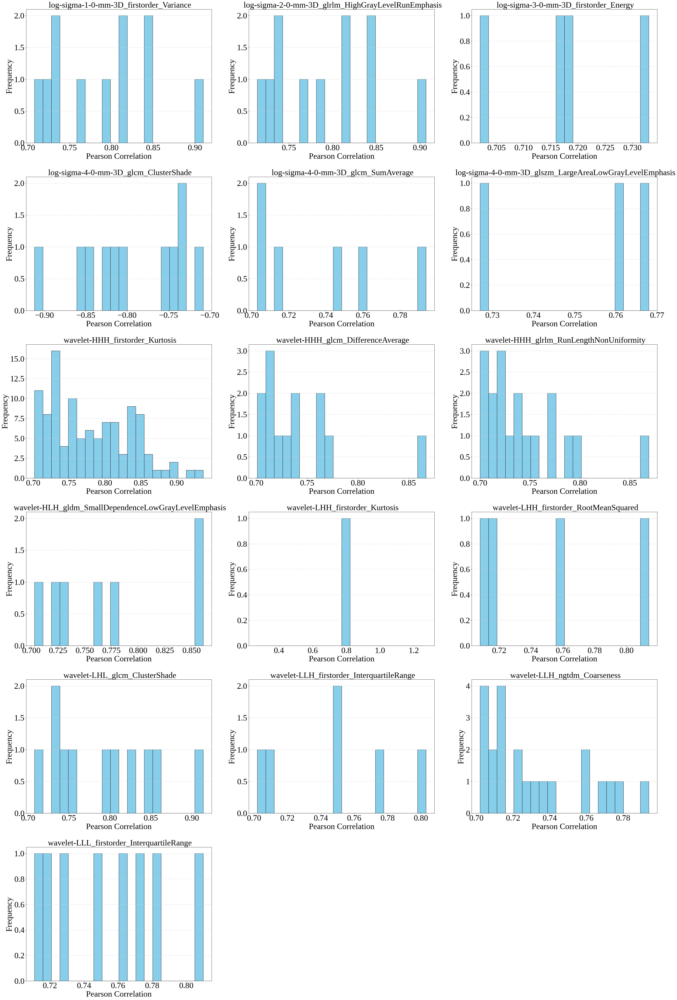

In [ ]:
#final version
#showing distribution of genes and radiomics with colormap used for th7 and th 0.005
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...
df = pd.read_excel('/content/cor_pearson_radio_gene_th7_final.xlsx')

# Group the data by column2 categories
grouped = df.groupby('column2')

# Update font settings
plt.rcParams.update({'font.size': 35, 'font.family': 'Liberation Serif'})

# Calculate number of categories
num_categories = len(grouped)
print(num_categories)
# Define the number of columns for the subplot grid
num_columns = 3  # You can adjust this value as needed

# Calculate the number of rows needed to accommodate all categories
num_rows = (num_categories + num_columns - 1) // num_columns

# Create subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(40, 10 * num_rows))

# Flatten the axes array to simplify indexing
axes = axes.flatten()

# Plot the data for each column2 category
for idx, (name, group) in enumerate(grouped):
    x_labels = group['column1']
    pearson_coef = group['pearson_coef']

    # Plot histogram for pearson_coef
    axes[idx].hist(pearson_coef, bins=20, color='skyblue', edgecolor='black')
    axes[idx].set_xlabel('Pearson Correlation',fontsize=35, fontfamily='Liberation Serif')
    axes[idx].set_ylabel('Frequency',fontsize=35, fontfamily='Liberation Serif')
    axes[idx].set_title(f' {name}',fontsize=35, fontfamily='Liberation Serif')
    axes[idx].grid(axis='y', linestyle='--', color='lightgray')

# Remove empty subplots if num_categories doesn't perfectly fit the grid
if len(grouped) < num_rows * num_columns:
    for idx in range(len(grouped), num_rows * num_columns):
        fig.delaxes(axes[idx])

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig('distribution_subplotsth7_v1.pdf', bbox_inches='tight', dpi=1000)
plt.show()


30


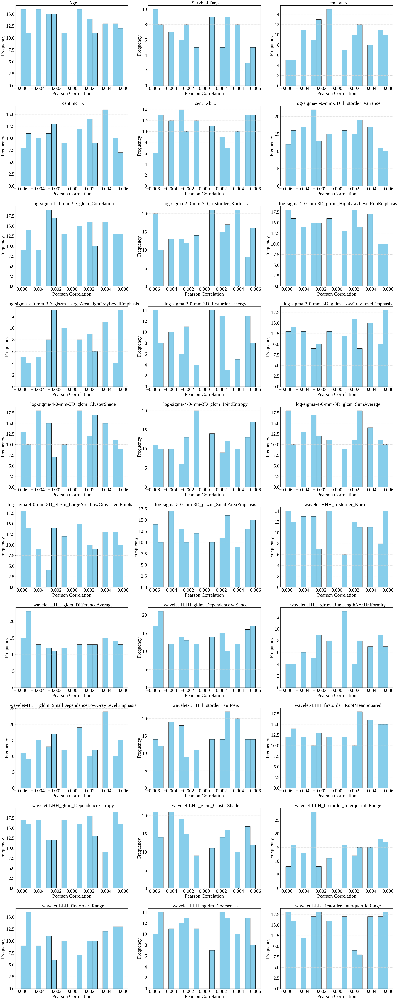

In [ ]:
#final version
#showing distribution of genes and radiomics with colormap used for th 0.005
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...
df = pd.read_excel('/content/corr_pearson_radiogenomicsth005_final.xlsx')

# Group the data by column2 categories
grouped = df.groupby('column2')

# Update font settings
plt.rcParams.update({'font.size': 35, 'font.family': 'Liberation Serif'})

# Calculate number of categories
num_categories = len(grouped)
print(num_categories)
# Define the number of columns for the subplot grid
num_columns = 3  # You can adjust this value as needed

# Calculate the number of rows needed to accommodate all categories
num_rows = (num_categories + num_columns - 1) // num_columns

# Create subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(40, 10 * num_rows))

# Flatten the axes array to simplify indexing
axes = axes.flatten()

# Plot the data for each column2 category
for idx, (name, group) in enumerate(grouped):
    x_labels = group['column1']
    pearson_coef = group['pearson_coef']

    # Plot histogram for pearson_coef
    axes[idx].hist(pearson_coef, bins=20, color='skyblue', edgecolor='black')
    axes[idx].set_xlabel('Pearson Correlation', fontsize=35, fontfamily='Liberation Serif')
    axes[idx].set_ylabel('Frequency', fontsize=35, fontfamily='Liberation Serif')
    axes[idx].set_title(f' {name}', fontsize=35, fontfamily='Liberation Serif')
    axes[idx].grid(axis='y', linestyle='--', color='lightgray')

# Remove empty subplots if num_categories doesn't perfectly fit the grid
if len(grouped) < num_rows * num_columns:
    for idx in range(len(grouped), num_rows * num_columns):
        fig.delaxes(axes[idx])

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig('distribution_subplots_th005v1.pdf', bbox_inches='tight', dpi=1000)
plt.show()


30


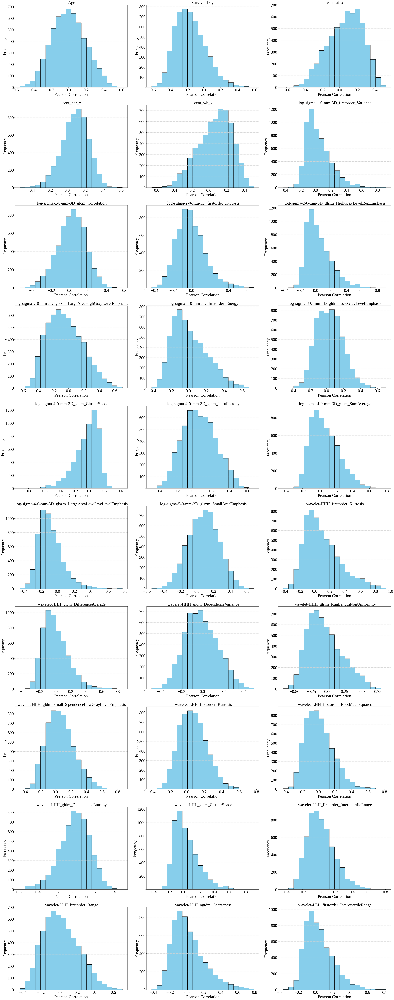

In [ ]:
#final version
#showing distribution of genes and radiomics with colormap used for th 0.005
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...
df = pd.read_csv('/content/radio_geneomics.csv')

# Group the data by column2 categories
grouped = df.groupby('column2')

# Update font settings
plt.rcParams.update({'font.size': 30, 'font.family': 'Liberation Serif'})

# Calculate number of categories
num_categories = len(grouped)
print(num_categories)
# Define the number of columns for the subplot grid
num_columns = 3  # You can adjust this value as needed

# Calculate the number of rows needed to accommodate all categories
num_rows = (num_categories + num_columns - 1) // num_columns

# Create subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(40, 10 * num_rows))

# Flatten the axes array to simplify indexing
axes = axes.flatten()

# Plot the data for each column2 category
for idx, (name, group) in enumerate(grouped):
    x_labels = group['column1']
    pearson_coef = group['pearson_coef']

    # Plot histogram for pearson_coef
    axes[idx].hist(pearson_coef, bins=20, color='skyblue', edgecolor='black')
    axes[idx].set_xlabel('Pearson Correlation',fontsize=30)
    axes[idx].set_ylabel('Frequency',fontsize=30)
    axes[idx].set_title(f'{name}',fontsize=30)
    axes[idx].grid(axis='y', linestyle='--', color='lightgray')

# Remove empty subplots if num_categories doesn't perfectly fit the grid
if len(grouped) < num_rows * num_columns:
    for idx in range(len(grouped), num_rows * num_columns):
        fig.delaxes(axes[idx])

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig('distribution_subplots_radiogenev1.pdf', bbox_inches='tight', dpi=1000)
plt.show()

<ipython-input-108-d024c091ea83>:30: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


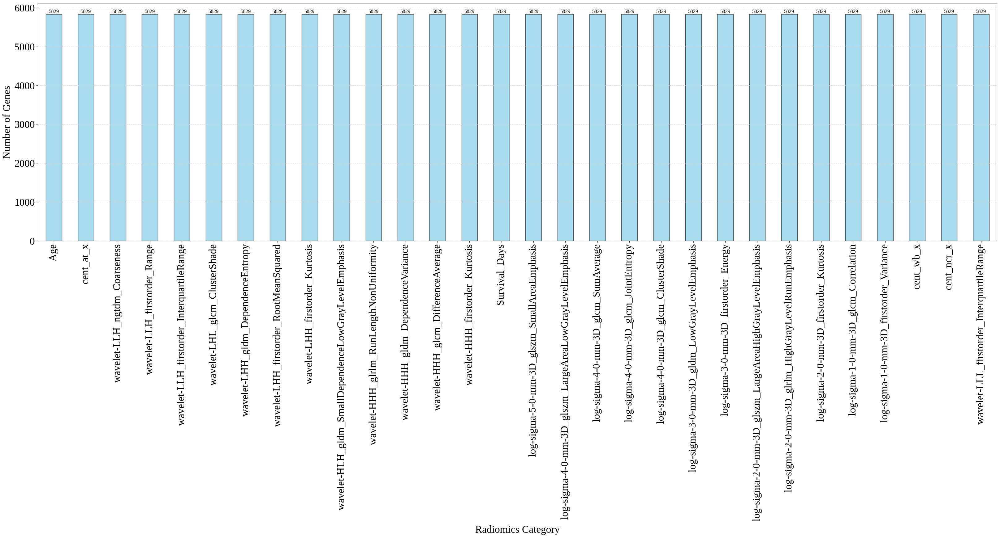

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame containing gene and radiomics data
df = pd.read_csv('/content/radio_geneomics.csv')

# Update font settings
plt.rcParams.update({'font.size': 24, 'font.family': 'Liberation Serif'})

# Counting the number of genes in each radiomics category
radiomics_counts = df['column2'].value_counts()

# Plotting the histogram with customizations
plt.figure(figsize=(40, 10))
bars = radiomics_counts.plot(kind='bar', color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel('Radiomics Category')
plt.ylabel('Number of Genes')
#plt.title('Histogram of Genes by Radiomics Category')


plt.xticks(rotation=90)
#ax.xticks(,rotation=90)
plt.grid(axis='y', linestyle='--', color='lightgray')

# Annotate each bar with its count (customizing the count)
for bar in bars.patches:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
             f'{int(bar.get_height())}', ha='center', va='bottom', fontsize=12, color='black')

plt.tight_layout()
plt.savefig('histogram.pdf',dpi=700)
plt.show()


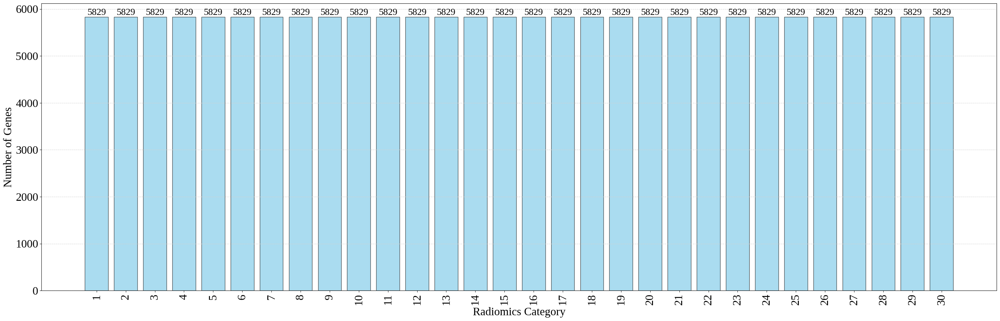

In [ ]:
#used
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame containing gene and radiomics data
df = pd.read_csv('/content/radio_geneomics.csv')

# Update font settings
plt.rcParams.update({'font.size': 24, 'font.family': 'Liberation Serif'})

# Counting the number of genes in each radiomics category
radiomics_counts = df['column2'].value_counts()

# Create a list of numbers for the x-axis
x_numbers = list(range(1, len(radiomics_counts) + 1))

# Plotting the histogram with customizations
fig, ax = plt.subplots(figsize=(30, 10))
bars = plt.bar(x_numbers, radiomics_counts, color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel('Radiomics Category')
plt.ylabel('Number of Genes')
plt.grid(axis='y', linestyle='--', color='lightgray')

# Annotate each bar with its count (customizing the count)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
             f'{int(bar.get_height())}', ha='center', va='bottom', fontsize=20, color='black')

# Customize x-axis ticks with the list of numbers
plt.xticks(x_numbers, rotation=90)

plt.tight_layout()
plt.savefig('histogramv1.pdf', dpi=700, bbox_inches='tight')
plt.show()


<ipython-input-7-1322e078428a>:36: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


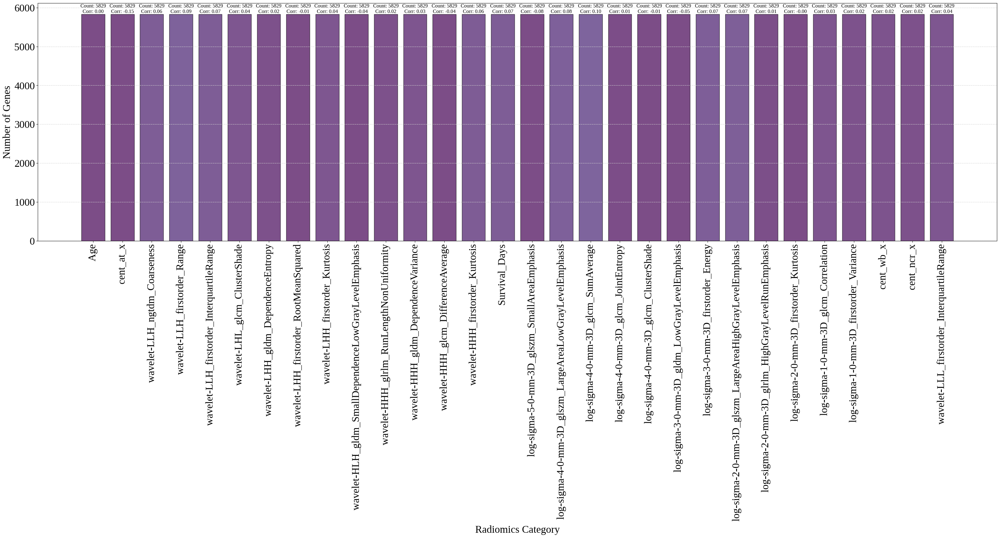

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing gene and radiomics data
df = pd.read_csv('/content/radio_geneomics.csv')

# Update font settings
plt.rcParams.update({'font.size': 24, 'font.family': 'Liberation Serif'})

# Grouping the data by radiomics category and calculating the mean Pearson correlation for each category
radiomics_corr_mean = df.groupby('column2')['pearson_coef'].mean()

# Counting the number of genes in each radiomics category
radiomics_counts = df['column2'].value_counts()

# Plotting the histogram with customizations
plt.figure(figsize=(40, 10))

# Plotting the bars with colors based on mean Pearson correlation
bars = plt.bar(radiomics_counts.index, radiomics_counts.values, color=plt.cm.viridis(radiomics_corr_mean.values), edgecolor='black', alpha=0.7)

plt.xlabel('Radiomics Category')
plt.ylabel('Number of Genes')
#plt.title('Histogram of Genes by Radiomics Category')

plt.xticks(rotation=90)
#ax.xticks(,rotation=90)
plt.grid(axis='y', linestyle='--', color='lightgray')

# Annotate each bar with its count and mean Pearson correlation
for bar, corr_value in zip(bars, radiomics_corr_mean.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
             f'Count: {int(bar.get_height())}\nCorr: {corr_value:.2f}', ha='center', va='bottom', fontsize=12, color='black')

plt.tight_layout()
plt.savefig('histogram_with_corr.pdf', dpi=700)
plt.show()


In [ ]:
import pandas as pd
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Assuming df is your DataFrame containing gene and radiomics data
df = pd.read_csv('/content/radio_geneomics_v1.csv')

# Grouping the data by radiomics category and collecting genes for each category
genes_by_category = df.groupby('column2')['column1'].apply(set)
print(len(genes_by_category))

plt.rcParams.update({'font.size': 12, 'font.family': 'Liberation Serif'})

# Plotting Venn diagrams for common genes in each category
num_categories = len(genes_by_category)
fig, axes = plt.subplots(num_categories, num_categories, figsize=(99, 90))

for i, (category, genes) in enumerate(genes_by_category.items()):
    for j, (other_category, other_genes) in enumerate(genes_by_category.items()):
        if i != j:
            common_genes = genes.intersection(other_genes)
            venn2([genes, other_genes], set_labels=[category, other_category], ax=axes[i, j])
            #axes[i, j].set_title(f'G: {len(common_genes)}', fontsize=10)

plt.tight_layout()
plt.savefig("venndiagram.pdf",dpi=800,bbox_inches='tight')
plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!rm -rf /content/*.pdf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...
df = pd.read_csv('/content/radio_geneomics.csv')

# Group the data by column2 categories
grouped = df.groupby('column2')
labels_dict = {}

# Update font settings
plt.rcParams.update({'font.size': 15, 'font.family': 'Liberation Serif'})

# Plot the data for each column2 category
for name, group in grouped:
    x_labels = group['column1'].tolist()
    pearson_coef = group['pearson_coef'].tolist()

    # Store x-axis labels in the dictionary
    labels_dict[name] = x_labels

    # Define colors based on the Pearson coefficient values
    norm = plt.Normalize(-1, 1)  # Normalize color scale to range from -1 to 1
    colors = plt.cm.coolwarm(norm(pearson_coef))  # Map colors to Pearson coefficient values

    # Plot the data with colors based on Pearson coefficient values
    fig, ax = plt.subplots(figsize=(20, 6))
    sc = ax.scatter(x_labels, pearson_coef, c=colors, s=30, alpha=0.8)
    ax.set_xlabel('Gene')
    ax.set_ylabel('Pearson Correlation')
    ax.set_title(f'Data Distribution for: {name}')
    plt.xticks(rotation=90)
    plt.gca().set_xticks(plt.gca().get_xticks()[::100])

    # Redefine the colorbar with custom range and appearance
    cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='coolwarm'), ax=ax, shrink=0.7, pad=0.001)
    cbar.set_label('Pearson Coefficient', rotation=90)

    # Save the plot
    plot_file_name = f'plot_for_group_col{name}.pdf'
    plt.savefig(plot_file_name, bbox_inches='tight', dpi=700)
    print(f'Plot for group {name} saved as {plot_file_name}')
    plt.show()

# Create DataFrame and CSV file
labels_df = pd.DataFrame(labels_dict)
labels_df.to_csv('group_labels_col.csv', index_label='group_name')
print('Group labels written to group_labels.csv')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!pip install --upgrade matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 31.9 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame containing feature1, feature2, and pearson correlation
# df = ...

# Group the data by feature1 categories
grouped = df.groupby('feature1')

# Plot the data for each feature1 category
for name, group in grouped:
    plt.figure(figsize=(8, 6))
    plt.scatter(group['feature2'], group['pearson_correlation'])
    plt.xlabel('Feature 2')
    plt.ylabel('Pearson Correlation')
    plt.title(f'Data Distribution for Feature1: {name}')
    plt.grid(True)
    plt.show()


(4476,)


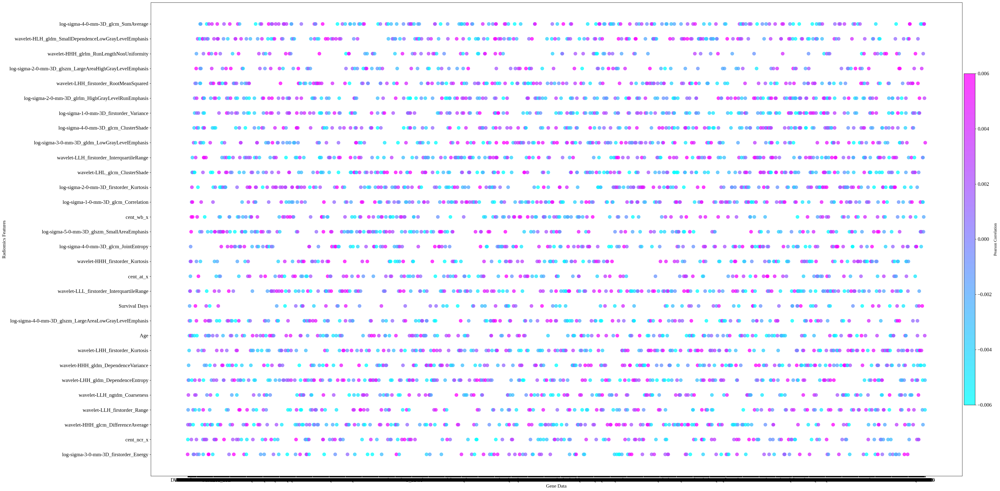

In [ ]:
import matplotlib.pyplot as plt
#here the features have threshold value >=0.7
# Read data from Excel file

df = pd.read_excel('/content/corr_pearson_radiogenomicsth005_final.xlsx')#threshold 0.005

# Assuming your Excel file has columns named 'Feature1', 'Feature2', and 'Correlation'
features1 = df['column1']
features2 = df['column2']
pearson_correlation = df['pearson_coef']
print(features1.shape)
# Plotting
plt.figure(figsize=(45, 20))
plt.scatter(features1, features2, c=pearson_correlation, cmap='cool', s=90, alpha=0.75)
colorbar=plt.colorbar(label='Pearson Correlation',pad=0.002,shrink=0.7,aspect=30)
colorbar.set_label(label='Pearson Correlation', fontsize=12, fontname='Liberation Serif',labelpad=5)

for label in colorbar.ax.yaxis.get_ticklabels():
    label.set_fontsize(15)
    label.set_fontname('Liberation Serif')
plt.xlabel('Gene Data',fontname='Liberation Serif', fontsize=14)
plt.ylabel('Radiomics Features',fontname='Liberation Serif', fontsize=14)
plt.xticks(fontsize=15, fontname='Liberation Serif')
plt.yticks(fontsize=15, fontname='Liberation Serif')
#plt.grid(True,linestyle='--')
plt.tight_layout()
plt.savefig('plot_pearson_th005.pdf', dpi=700,bbox_inches='tight')#,bbox_inches='tight'
plt.show()
#244 gene information and 16 radiomics features
#4476 gene information for threshold value

In [ ]:
import matplotlib.font_manager
print([f.name for f in matplotlib.font_manager.fontManager.ttflist])

['DejaVu Sans Mono', 'cmb10', 'DejaVu Sans Mono', 'STIXNonUnicode', 'cmtt10', 'STIXSizeOneSym', 'DejaVu Serif', 'STIXGeneral', 'DejaVu Sans Display', 'STIXNonUnicode', 'DejaVu Sans Mono', 'STIXSizeTwoSym', 'STIXSizeThreeSym', 'STIXNonUnicode', 'cmex10', 'cmss10', 'DejaVu Sans', 'STIXSizeOneSym', 'STIXSizeTwoSym', 'STIXSizeFourSym', 'STIXNonUnicode', 'STIXGeneral', 'cmsy10', 'cmmi10', 'DejaVu Sans', 'STIXGeneral', 'DejaVu Sans', 'cmr10', 'DejaVu Sans', 'DejaVu Serif', 'DejaVu Sans Mono', 'DejaVu Serif', 'STIXSizeFourSym', 'STIXSizeThreeSym', 'STIXSizeFiveSym', 'STIXGeneral', 'DejaVu Serif', 'DejaVu Serif Display', 'Liberation Sans', 'Liberation Sans', 'Liberation Serif', 'Liberation Serif', 'Liberation Mono', 'Liberation Serif', 'Liberation Mono', 'Liberation Sans', 'Liberation Sans Narrow', 'Liberation Serif', 'Liberation Sans Narrow', 'Humor Sans', 'Liberation Sans', 'Liberation Sans Narrow', 'Liberation Mono', 'Liberation Sans Narrow', 'Liberation Mono']


In [ ]:
#generate pearson and spearman correlation between radiomics features (excel) and genes (another excel)
#removed BraTS20_Training_278 from gene excel and it is not there in radiomics features excel
import pandas as pd
import numpy as np
import csv
from scipy.stats import spearmanr, pearsonr

# Assuming your CSV file is correctly formatted with the gene names in the first column
#df = pd.read_csv('/content/GENE.csv',index_col=0)
df = pd.read_excel('/content/reduced_radiomic_features.xlsx',index_col=0)
df_reduced = df['BraTS20_Training_278']

"""
# Transpose the DataFrame to have genes as rows
df_transposed = df.transpose()
#print("transpose",df_transposed)
x_train = df_transposed.iloc[:, :].values
#print("x_train",x_train)
count = 0
"""
# This loop is for remaining index after 998
for i in range(0, x_train.shape[1]):

    for j in range(0, x_train.shape[1]):
        if i == j:
            continue
        count += 1

        coef, p= pearsonr(x_train[:,i], x_train[:,j])
        coef_spearman, p_spearman = spearmanr(x_train[:,i], x_train[:,j])
        print('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))
"""
with open('pearson.csv', 'w') as f:
    w = csv.DictWriter(f,["column1","column2","coef","rho_value"])
    w.writeheader()
    for i in range(0,x_train.shape[1]):
        for j in range(0,x_train.shape[1]):
          if (i==j):
            continue
          coef,p= pearsonr(x_train[:,i], x_train[:,j])
          if (abs(coef)<0.2):
              f.write('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))
          f.write('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))

print("Total comparisons:", count)


In [ ]:
import pandas as pd
import numpy as np
import csv
from scipy.stats import spearmanr, pearsonr

# Assuming your CSV file is correctly formatted with the gene names in the first column
#df = pd.read_csv('/content/GENE.csv',index_col=0)
df = pd.read_csv('/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv',index_col=0)

# Transpose the DataFrame to have genes as rows
df_transposed = df.transpose()
#print("transpose",df_transposed)
x_train = df_transposed.iloc[:, :].values
#print("x_train",x_train)
count = 0
"""
# This loop is for remaining index after 998
for i in range(0, x_train.shape[1]):

    for j in range(0, x_train.shape[1]):
        if i == j:
            continue
        count += 1

        coef, p= pearsonr(x_train[:,i], x_train[:,j])
        coef_spearman, p_spearman = spearmanr(x_train[:,i], x_train[:,j])
        print('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))
"""
with open('pearson.csv', 'w') as f:
    w = csv.DictWriter(f,["column1","column2","coef","rho_value"])
    w.writeheader()
    for i in range(0,x_train.shape[1]):
        for j in range(0,x_train.shape[1]):
          if (i==j):
            continue
          coef,p= pearsonr(x_train[:,i], x_train[:,j])
          if (abs(coef)<0.2):
              f.write('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))
          f.write('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))

print("Total comparisons:", count)


KeyboardInterrupt: 

In [ ]:
import pandas as pd
from scipy.stats import spearmanr, pearsonr

# Assuming your CSV file is correctly formatted with the gene names in the first column
df = pd.read_csv('/content/GENE.csv', index_col=0)
print("df",df.shape)
# Transpose the DataFrame to have genes as rows
df_transposed = df.transpose()
print("df_transposed",df_transposed.shape)
print(x_train.shape)
# Calculate all possible correlations between genes
count = 0
for i in range(0, df_transposed.shape[1]):
    for j in range(i , df_transposed.shape[1]):
        if(i==j):
           continue
        coef,p= pearsonr(x_train[:,i], x_train[:,j])
        coef,p= spearmanr(x_train[:,i], x_train[:,j])
        print('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))

        #coef_pearson, p_pearson = pearsonr(df_transposed.loc[gene1], df_transposed.loc[gene2])
        #coef_spearman, p_spearman = spearmanr(df_transposed.loc[gene1], df_transposed.loc[gene2])

        #print('%s, %s, Pearson: %.3f, %.3f, Spearman: %.3f, %.3f\n' %(gene1, gene2, coef_pearson, p_pearson, coef_spearman, p_spearman))
        count += 1

print("Total comparisons:", count)


df (5, 3)
df_transposed (3, 5)
(3, 5)
AP006621.6, AL391628.1, 1.000, 0.000

AP006621.6, AL592295.6, -1.000, 0.000

AP006621.6, AC008763.4, 0.866, 0.333

AP006621.6, AC078856.1, nan, nan

AL391628.1, AL592295.6, -1.000, 0.000

AL391628.1, AC008763.4, 0.866, 0.333

AL391628.1, AC078856.1, nan, nan

AL592295.6, AC008763.4, -0.866, 0.333

AL592295.6, AC078856.1, nan, nan

AC008763.4, AC078856.1, nan, nan

Total comparisons: 10


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


In [ ]:
#grid search for classification
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score,StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from scipy.stats import chi2_contingency
from sklearn.model_selection import GridSearchCV
from sklearn import utils
df = pd.read_excel('/content/Validation_gene_final_clinical_classification_withgene.xlsx')
# csq=chi2_contingency(pd.crosstab(df['Survived'], train['Sex']))
# print("P-value: ",csq[1])

x = df.values
x_train = x[:,3:]
#print(x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,1].astype(int)#check for classification problem
#y_train=np.float32(y_train) #added for permutation_information
print(type(y_train))
print(len(y_train))
print(y_train)

#y_train = utils.column_or_1d(y_train.ravel(), warn=True)
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.3, random_state=42)
#Applying K fold cross validation
kfold = KFold(n_splits=5, shuffle=True)#Default shuffle=True
#LAsso regressor Best: -4120.009644 using {'alpha': 0.0058000000000000005}
#RF classifier{'criterion': 'gini', 'max_depth': 2, 'max_features': 'auto', 'min_samples_leaf': 4, 'n_estimators': 25, 'random_state': 0}
#ExtraTreesclassifier{'criterion': 'gini', 'max_depth': 2, 'max_features': 'auto', 'min_samples_leaf': 4, 'n_estimators': 25, 'random_state': 0}
param_grid = {
    'n_estimators': [25,30,40, 50, 60, 100],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [2,3, 4,5,6,7,8],
    'criterion' :['gini', 'entropy'],
    'min_samples_leaf': [2,4,5,6,8,9,10],
    'random_state':[0,1,2,5, 42]}

##--------------------------------------------------------------------------##

clf= ExtraTreesClassifier()#RandomForestClassifier()
#clf=Ridge()#Lasso()
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=None)
#cv = RepeatedKFold(n_splits=3, n_repeats=3, random_state=1)
#clf = MLPRegressor(random_state=1, max_iter=800,early_stopping=True)
CV_rfc = GridSearchCV(estimator=clf, param_grid=param_grid, cv= 5,n_jobs=-1)
grid_result=CV_rfc.fit(x_train, y_train)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


<class 'numpy.ndarray'>
34
[0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1]


KeyboardInterrupt: 

x-train shape (34, 34)
<class 'numpy.ndarray'>
Accuracy_Train: 0.565217, accuracy_test: 0.636364
[[0 4]
 [0 7]]
[1 1 1 1 0 1 1 0 1 0 0]
[1 1 1 1 1 1 1 1 1 1 1]
No Skill: ROC AUC=0.500
XGBClassifier: ROC AUC=0.786


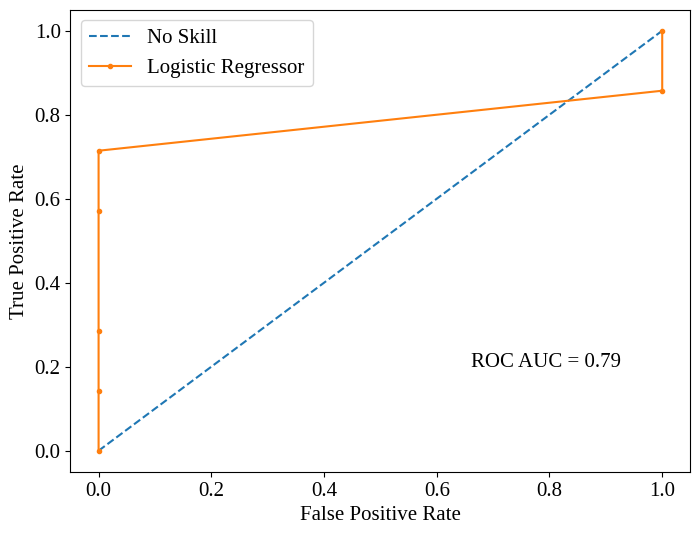

In [ ]:
#classification problem for Validation_gene set
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score,StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from scipy.stats import chi2_contingency
from sklearn.model_selection import GridSearchCV
from sklearn import utils
from sklearn.metrics import accuracy_score,confusion_matrix, roc_curve, roc_auc_score
df = pd.read_excel('/content/Validation_gene_final_clinical_classification_withgene2_th7.xlsx')
# csq=chi2_contingency(pd.crosstab(df['Survived'], train['Sex']))
# print("P-value: ",csq[1])

x = df.values
x_train = x[:,3:]
print("x-train shape",x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,1].astype(int)#check for classification problem
#y_train=np.float32(y_train) #added for permutation_information
y_train = utils.column_or_1d(y_train.ravel(), warn=True)
print(type(y_train))



#RF Best: 0.69 {'criterion': 'gini', 'max_depth': 2, 'max_features': 'auto', 'min_samples_leaf': 4, 'n_estimators': 25, 'random_state': 0}
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.3, random_state=42)
#clf= RandomForestClassifier(criterion='gini', max_depth=2, max_features='auto', min_samples_leaf=4, n_estimators= 25, random_state= 2)
#clf=ExtraTreesClassifier(criterion= 'gini', max_depth=2, max_features= 'auto', min_samples_leaf= 2, n_estimators= 30, random_state=10)
#clf=XGBClassifier(alpha=1, eta=0.0001, reg_lambda=1,  max_delta_step=0, max_depth=2, max_leaves=0,min_child_weight=1)
#clf = LogisticRegression(C=1, penalty='l2', solver='newton-cg',tol=0.001)


# after adding gene information
#clf= RandomForestClassifier(criterion='gini', max_depth=2, max_features='auto', min_samples_leaf=3, n_estimators= 25, random_state= 2)
clf=XGBClassifier(alpha=1, eta=0.002, reg_lambda=1,  max_delta_step=0, max_depth=2, max_leaves=0,min_child_weight=1)
#clf=ExtraTreesClassifier(criterion= 'gini', max_depth=3, max_features= 'auto', min_samples_leaf= 3, n_estimators= 30, random_state=0)
#clf = LogisticRegression(C=0.3, penalty='l2', solver='newton-cg',tol=0.001)
#clf= RandomForestClassifier(criterion='gini', max_depth=2, max_features='auto', min_samples_leaf=3, n_estimators= 25, random_state= 2)#th7
y_train = utils.column_or_1d(y_train.ravel(), warn=True)
y_test = utils.column_or_1d(y_test.ravel(), warn=True)
# Make predictions
clf.fit(x_train,y_train)
y_pred = clf.predict(x_test)
y_pred_train = clf.predict(x_train)
accuracy_train = accuracy_score(y_train, y_pred_train)
# Evaluate the model
accuracy_test = accuracy_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
print("Accuracy_Train: %f, accuracy_test: %f" % (accuracy_train, accuracy_test))
lr_probs = clf.predict_proba(x_test)
print(cm)
print(y_test)
print(y_pred)


default_params = plt.rcParams

# Modifying default parameters
plt.rcParams['font.family'] = 'Liberation Serif'
plt.rcParams['font.size'] = 15

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
ns_probs = roc_auc_score(y_test, [0 for _ in range(len(y_test))])
# calculate scores
# Calculate scores
ns_auc = roc_auc_score(y_test, [0 for _ in range(len(y_test))])  # No Skill model
lr_auc = roc_auc_score(y_test, lr_probs)  # Random Forest classifier

# Summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('XGBClassifier: ROC AUC=%.3f' % (lr_auc))

# Calculate ROC curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, [0 for _ in range(len(y_test))])  # No Skill model
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)  # Random Forest classifier
plt.figure(figsize=(8, 6))
# Plot ROC curve
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic Regressor')#label='ExtraRF Classifier''Logistic Regressor''XGB Classifier'

# Customize plot
plt.text(0.66, 0.2, f'ROC AUC = {lr_auc:.2f}', fontname='Liberation Serif', fontsize=15)
plt.xlabel('False Positive Rate',fontname='Liberation Serif', fontsize=15)
plt.ylabel('True Positive Rate',fontname='Liberation Serif', fontsize=15)
#plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(prop={'size': 15, 'family': 'Liberation Serif'})
plt.savefig("LRROC_curve(gene)txt.pdf",dpi=700,bbox_inches='tight')
plt.show()


In [ ]:
!pip install tensorflow tensorflow_probability

In [ ]:
import pandas as pd
from scipy.stats import spearmanr, pearsonr

# Assuming your CSV file is correctly formatted with the gene names in the first column
df = pd.read_csv('/content/GENE.csv', index_col=0)
print("df",df.shape)
# Transpose the DataFrame to have genes as rows
df_transposed = df.transpose()
print("df_transposed",df_transposed.shape)
print(x_train.shape)
# Calculate all possible correlations between genes
count = 0
for i in range(0, df_transposed.shape[1]):
    for j in range(i , df_transposed.shape[1]):
        if(i==j):
           continue
        count += 1
        coef,p= pearsonr(x_train[:,i], x_train[:,j])
        if(abs(coef)<0.05):
            coef_p,pp= pearsonr(x_train[:,i], x_train[:,j])
            coef_s,ps= spearmanr(x_train[:,i], x_train[:,j])
            f.write('%s, %s, Pearson: %.3f, %.3f, Spearman: %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef_p, pp, coef_s, ps))
        print('%s, %s, %.3f, %.3f\n' %(df_transposed.columns[i], df_transposed.columns[j], coef, p))

        #coef_pearson, p_pearson = pearsonr(df_transposed.loc[gene1], df_transposed.loc[gene2])
        #coef_spearman, p_spearman = spearmanr(df_transposed.loc[gene1], df_transposed.loc[gene2])

        #print('%s, %s, Pearson: %.3f, %.3f, Spearman: %.3f, %.3f\n' %(gene1, gene2, coef_pearson, p_pearson, coef_spearman, p_spearman))


print("Total comparisons:", count)


In [ ]:
#finding correlation using GPUs
import pandas as pd
import csv
import tensorflow as tf
import tensorflow_probability as tfp
from scipy.stats import spearmanr, pearsonr

# Check for TPU availability
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print("Device:", tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
    print('Running on TPU...')
except ValueError:
    # TPU not available, fall back to GPU
    strategy = tf.distribute.get_strategy()
    print('Running on CPU/GPU...')

# Assuming your CSV file is correctly formatted with the gene names in the first column
df = pd.read_csv('/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv', index_col=0)
print("df", df.shape)

# Transpose the DataFrame to have genes as rows
df_transposed = df.transpose()
print("df_transposed", df_transposed.shape)

# Convert the DataFrame to a TensorFlow tensor
with strategy.scope():
    x_train = tf.convert_to_tensor(df_transposed.values, dtype=tf.float32)
print("x_train", x_train.shape)

# Calculate all possible correlations between genes
count = 0
with strategy.scope():
    with open('/content/drive/MyDrive/brats_gene/personpt02_gpu_3_0.csv', 'w') as f:
        w = csv.DictWriter(f, ["column1", "column2", "pearson_coef", "count"])
        w.writeheader()

        for i in range(0, df_transposed.shape[1]):
            for j in range(i + 1, df_transposed.shape[1]):
                if i == j:
                    continue

                coef = tfp.stats.correlation(x_train[:, i], x_train[:, j], sample_axis=0, event_axis=None)

                # You can use the result 'coef' directly, or convert it to a NumPy array if needed
                coef_value = coef.numpy()

                if abs(coef_value) <= 0.01:
                    count += 1
                    if count < 1048575:
                        print("count_2", count)
                        f.write('%s, %s, Pearson: %.3f,%d\n' % (df_transposed.columns[i], df_transposed.columns[j], coef_value, count))
                        print('%s, %s, %.3f,count=%d\n' % (df_transposed.columns[i], df_transposed.columns[j], coef_value, count))
                    elif count < 2097145:
                        print("count in else_if", count)
                        with open('/content/drive/MyDrive/brats_gene/personpt01_gpu3_1.csv', 'a') as f1:
                            w1 = csv.DictWriter(f1, ["column1", "column2", "pearson_coef", "count"])
                            if count == 1048575 + 1:
                                w1.writeheader()
                            f1.write('%s, %s, Pearson: %.3f,%d\n' % (df_transposed.columns[i], df_transposed.columns[j], coef_value, count))
                    elif count < 3145710:
                        print("count in else_if", count)
                        with open('/content/drive/MyDrive/brats_gene/personpt01_gpu3_2.csv', 'a') as f2:
                            w2 = csv.DictWriter(f2, ["column1", "column2", "pearson_coef", "count"])
                            if count == 2097145 + 1:
                                w2.writeheader()
                            f2.write('%s, %s, Pearson: %.3f,%d\n' % (df_transposed.columns[i], df_transposed.columns[j], coef_value, count))
                    else:
                        print("count in else_else", count)
                        with open('/content/drive/MyDrive/brats_gene/personpt01_gpu3_3.csv', 'a') as f3:
                            w3 = csv.DictWriter(f3, ["column1", "column2", "pearson_coef", "count"])
                            if count == 3145710 + 1:
                                w3.writeheader()
                            f3.write('%s, %s, Pearson: %.3f,%d\n' % (df_transposed.columns[i], df_transposed.columns[j], coef_value, count))

print("Total comparisons:", count)


In [ ]:
#VIF Variance Inflation Factor (VIF)
import pandas as pd
import numpy as np
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
df = pd.read_csv('/content/drive/MyDrive/brats_gene/filtered_gene_expr_final.csv', index_col=0)
print("df",df.shape)
# Transpose the DataFrame to have genes as rows
X=df_transposed = df.transpose()
print("df_transposed",df_transposed.shape)

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

df (52091, 34)
df_transposed (34, 52091)


x-train shape (34, 32)
34
Accuracy_Train: 0.520000, accuracy_test: 0.777778
[[0 2]
 [0 7]]
ytest [1 1 1 1 0 1 1 0 1]
ypred [1 1 1 1 1 1 1 1 1]
No Skill: ROC AUC=0.500
XGBClassifier: ROC AUC=0.607


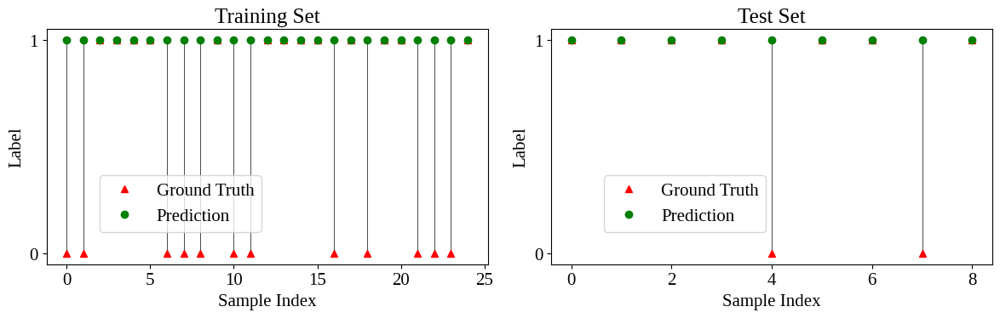

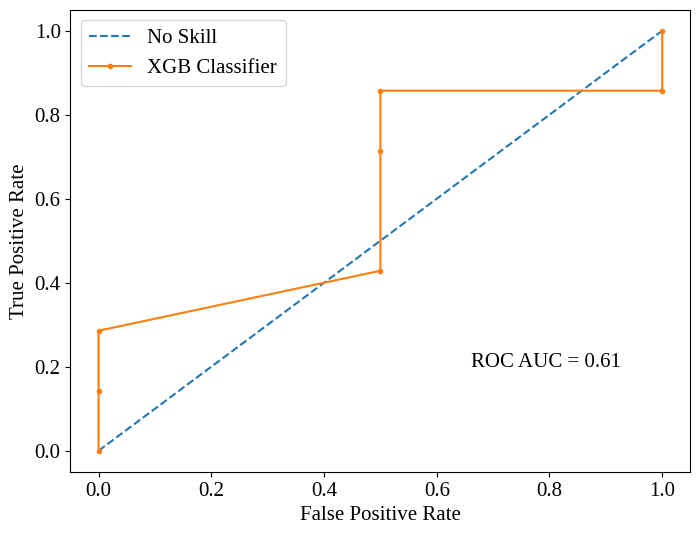

In [22]:
#classification problem for Validation_gene set
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold,GridSearchCV, cross_val_score,StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from scipy.stats import chi2_contingency
from sklearn.model_selection import GridSearchCV
from sklearn import utils
from sklearn.metrics import accuracy_score,confusion_matrix, roc_curve, roc_auc_score
df = pd.read_excel('/content/Validation_gene_final_clinical_classification (1).xlsx')
# csq=chi2_contingency(pd.crosstab(df['Survived'], train['Sex']))
# print("P-value: ",csq[1])

x = df.values
x_train = x[:,3:]
print("x-train shape",x_train.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

y_train = x[:,1].astype(int)#check for classification problem
#y_train=np.float32(y_train) #added for permutation_information
y_train = utils.column_or_1d(y_train.ravel(), warn=True)
print(len(y_train))

#RF Best: 0.69 {'criterion': 'gini', 'max_depth': 2, 'max_features': 'auto', 'min_samples_leaf': 4, 'n_estimators': 25, 'random_state': 0}
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.25, random_state=42)
#clf= RandomForestClassifier(criterion='gini', max_depth=2, max_features='sqrt', min_samples_leaf=4, n_estimators= 25, random_state= 0)
#clf=ExtraTreesClassifier(criterion= 'gini', max_depth=2, max_features= 'sqrt', min_samples_leaf= 2, n_estimators= 30, random_state=1)
clf=XGBClassifier(alpha=1, eta=0.0001, reg_lambda=1,  max_delta_step=0, max_depth=2, max_leaves=0,min_child_weight=1,random_state=0)
#clf = LogisticRegression(C=1, penalty='l2', solver='newton-cg',tol=0.001)

# after adding gene information
#clf= RandomForestClassifier(criterion='gini', max_depth=2, max_features='auto', min_samples_leaf=4, n_estimators= 25, random_state= 0)
#clf=XGBClassifier(alpha=1, eta=0.001, reg_lambda=1,  max_delta_step=0, max_depth=2, max_leaves=0,min_child_weight=1,random_state=42)
#clf=ExtraTreesClassifier(criterion= 'gini', max_depth=2, max_features= 'auto', min_samples_leaf= 2, n_estimators= 30, random_state=1)
#clf = LogisticRegression(C=1, penalty='l2', solver='newton-cg',tol=0.001)#C=1, penalty='l2', solver='newton-cg',tol=0.001
y_train = utils.column_or_1d(y_train.ravel(), warn=True)
y_test = utils.column_or_1d(y_test.ravel(), warn=True)
# Make predictions
clf.fit(x_train,y_train)
y_pred = clf.predict(x_test)
y_pred_train = clf.predict(x_train)
accuracy_train = accuracy_score(y_train, y_pred_train)
# Evaluate the model
accuracy_test = accuracy_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
print("Accuracy_Train: %f, accuracy_test: %f" % (accuracy_train, accuracy_test))
lr_probs = clf.predict_proba(x_test)
print(cm)
print("ytest",y_test)
print("ypred",y_pred)

# Plotting ground truth and predicted labels for training and test sets
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# Training set
for i in range(len(y_train)):
    ax1.plot([i, i], [y_train[i], y_pred_train[i]], c="k", linewidth=0.5)
ax1.plot(y_train, '^', label='Ground Truth', color='r')
ax1.plot(y_pred_train, 'o', label='Prediction', color='g')
ax1.set_title('Training Set')
ax1.set_xlabel('Sample Index')
ax1.set_ylabel('Label')
ax1.set_yticks([0, 1])
ax1.legend(loc='lower left',bbox_to_anchor=(0.1, 0.1),prop={'size': 15, 'family': 'Liberation Serif'})

# Test set
for i in range(len(y_test)):
    ax2.plot([i, i], [y_test[i], y_pred[i]], c="k", linewidth=0.5)
ax2.plot(y_test, '^', label='Ground Truth', color='r')
ax2.plot(y_pred, 'o', label='Prediction', color='g')
ax2.set_title('Test Set')
ax2.set_xlabel('Sample Index')
ax2.set_ylabel('Label')
ax2.set_yticks([0, 1])
ax2.legend(loc='lower left',bbox_to_anchor=(0.1, 0.1),prop={'size': 15, 'family': 'Liberation Serif'})

plt.tight_layout()

plt.savefig("training_test_XGBv1.pdf",dpi=1000, bbox_inches='tight')

default_params = plt.rcParams

# Modifying default parameters
plt.rcParams['font.family'] = 'Liberation Serif'
plt.rcParams['font.size'] = 15

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
ns_probs = roc_auc_score(y_test, [0 for _ in range(len(y_test))])
# calculate scores
# Calculate scores
ns_auc = roc_auc_score(y_test, [0 for _ in range(len(y_test))])  # No Skill model
lr_auc = roc_auc_score(y_test, lr_probs)  # Random Forest classifier

# Summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('XGBClassifier: ROC AUC=%.3f' % (lr_auc))

# Calculate ROC curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, [0 for _ in range(len(y_test))])  # No Skill model
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)  # Random Forest classifier
plt.figure(figsize=(8, 6))
# Plot ROC curve
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(lr_fpr, lr_tpr, marker='.', label='XGB Classifier')#label='ExtraRF Classifier''Logistic Regressor''XGB Classifier'

# Customize plot
plt.text(0.66, 0.2, f'ROC AUC = {lr_auc:.2f}', fontname='Liberation Serif', fontsize=15)
plt.xlabel('False Positive Rate',fontname='Liberation Serif', fontsize=15)
plt.ylabel('True Positive Rate',fontname='Liberation Serif', fontsize=15)
#plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(prop={'size': 15, 'family': 'Liberation Serif'})
plt.savefig("XGB_ROC_curve.pdf",dpi=1000, bbox_inches='tight')
plt.show()


In [ ]:
#!pip install scikit-survival
!pip install lifelines

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.2/349.2 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.2/94.2 kB 7.3 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=f859b811e7a1c9938dfd4ee8b8761f26739670ccb1fa31db43d1093bab18354e
  Stored in directory: /root/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma


In [ ]:
from sklearn import set_config
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#from sksurv.linear_model import CoxPHSurvivalAnalysis
from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()
set_config(display="text")  # displays text representation of estimators

df = pd.read_excel('/content/Validation_gene_final_clinical_class.xlsx')
# csq=chi2_contingency(pd.crosstab(df['Survived'], train['Sex']))
# print("P-value: ",csq[1])
print(type(df))
x = df.values

x_train = x[:,3:]
x = x[:,6]#x[:,3:]
print("x-train shape",x.shape)

datalist = x_train.tolist()

#x_train=np.array(datalist, dtype=np.float32)
datalist = np.float32(datalist)
x_train = np.array(datalist)
x_train = np.nan_to_num(x_train)

T = df['Survival Days']#'Age'
E = df['treatment_type']#'Survival Days'
kmf.fit(T, event_observed=E)
#T is an array of durations, E is a either boolean or binary array representing whether the “death” was observed or not (alternatively an individual can be censored)

<class 'pandas.core.frame.DataFrame'>
x-train shape (34,)


<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 34 total observations, 16 right-censored observations>

<Axes: xlabel='timeline'>

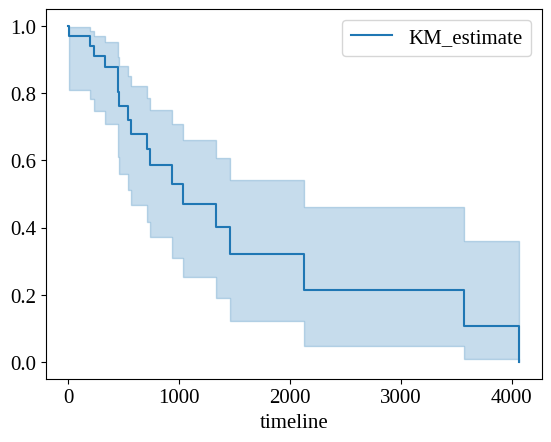

In [ ]:
km = KaplanMeierFitter()
T = df['Survival Days']#'Age'
E = df['treatment_type']#'Survival Days'
km.fit(T, event_observed=E)
km.survival_function_
km.cumulative_density_
km.plot_survival_function()

<Axes: xlabel='timeline'>

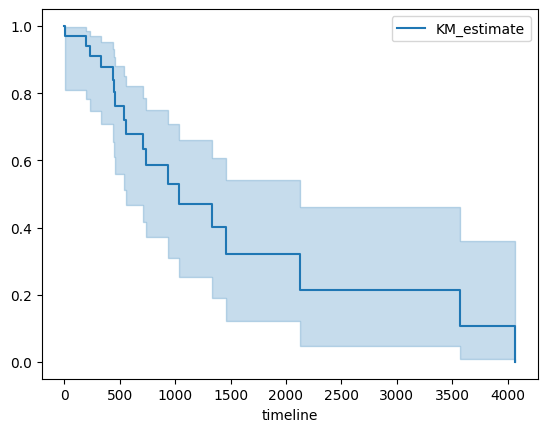

In [ ]:
kmf.survival_function_
kmf.cumulative_density_
kmf.plot_survival_function()


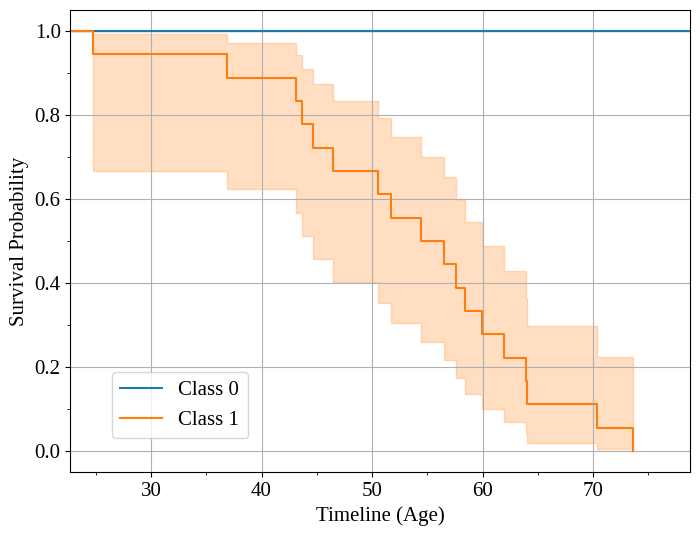

In [ ]:
from matplotlib.ticker import AutoMinorLocator
km = KaplanMeierFitter()

plt.rcParams['figure.figsize'] = (8, 6)  # Set default figure size to (8, 6) inches
plt.rcParams['font.family'] = 'Liberation Serif'     # Set default font family to serif
plt.rcParams['font.size'] = 15
plt.rcParams['axes.grid'] = True


# Define time-to-event (T) and event occurrence (E)
T = df['Age']  # Time
E = df['treatment_type']  # Event occurrence (e.g., treatment type)

# Fit the Kaplan-Meier model for different classes
for class_label in df['treatment_type'].unique():
    km.fit(T[df['treatment_type'] == class_label], event_observed=E[df['treatment_type'] == class_label])
    # Plot the Kaplan-Meier survival curve for each class
    km.plot_survival_function(label=f"Class {class_label}")

# Enable minor ticks
plt.minorticks_on()

# Set minor locator for x-axis
plt.gca().xaxis.set_minor_locator(AutoMinorLocator(2))

# Set minor locator for y-axis
plt.gca().yaxis.set_minor_locator(AutoMinorLocator(2))

plt.xlim(min(T)-2, max(T))
plt.xlabel('Timeline (Age)',fontname='Liberation Serif', fontsize=15)
plt.ylabel('Survival Probability',fontname='Liberation Serif', fontsize=15)
# Show the legend
plt.legend(loc='lower left', bbox_to_anchor=(0.05, 0.05), prop={'size': 15, 'family': 'Liberation Serif'})
plt.savefig("KM_treatment.pdf",dpi=1000,bbox_inches='tight')
# Show the plot
plt.show()

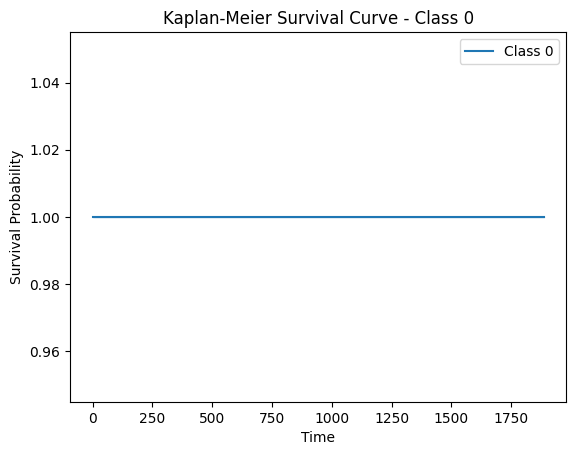

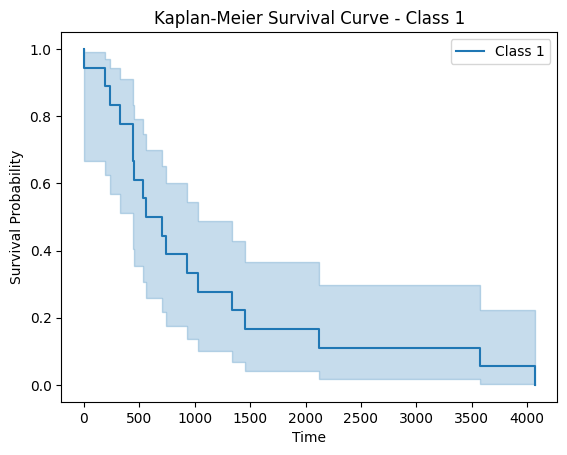

In [ ]:
import matplotlib.pyplot as plt

# Initialize Kaplan-Meier object
km = KaplanMeierFitter()

# Get unique class labels
class_labels = df['treatment_type'].unique()

# Create separate plots for each class
for class_label in class_labels:
    # Initialize a new plot for each class
    plt.figure()

    # Fit the Kaplan-Meier model for the current class
    km.fit(T[df['treatment_type'] == class_label], event_observed=E[df['treatment_type'] == class_label])

    # Plot the Kaplan-Meier survival curve for the current class
    km.plot_survival_function(label=f"Class {class_label}")

    # Add plot title
    plt.title(f"Kaplan-Meier Survival Curve - Class {class_label}")

    # Add axis labels
    plt.xlabel("Time")
    plt.ylabel("Survival Probability")

    # Show legend
    plt.legend()

    # Show the plot for the current class
    plt.show()


<lifelines.CoxPHFitter: fitted with 34 total observations, 16 right-censored observations>
             duration col = 'Age'
                event col = 'treatment_type'
      baseline estimation = breslow
   number of observations = 34
number of events observed = 18
   partial log-likelihood = -38.77
         time fit was run = 2024-04-23 11:44:02 UTC

---
                                                           coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                                                        
Survival_categories                                        0.23       1.26       5.23           -10.03            10.49                 0.00             35855.89
Survival Days                                              0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
gender                                                     1.01       2.75       3.73            -6.30             8.32                 0.00              4107.42
race                                                      -1.50       0.22       6.69           -14.61            11.61                 0.00             1.10e+05
cent_ncr_x                                                -0.00       1.00       0.08            -0.15             0.15                 0.86                 1.17
cent_at_x                                                  0.06       1.06       0.29            -0.50             0.62                 0.60                 1.87
cent_wb_x                                                 -0.07       0.93       0.29            -0.64             0.50                 0.53                 1.66
wavelet-LLH_firstorder_InterquartileRange                 -0.19       0.83       0.52            -1.20             0.82                 0.30                 2.27
wavelet-LLH_firstorder_Range                              -0.00       1.00       0.01            -0.03             0.02                 0.97                 1.02
wavelet-LLH_ngtdm_Coarseness                              71.31   9.30e+30     538.15          -983.45          1126.06                 0.00                  inf
wavelet-LHL_glcm_ClusterShade                              0.00       1.00       0.02            -0.03             0.03                 0.97                 1.03
wavelet-LHH_firstorder_Kurtosis                           -0.01       0.99       0.03            -0.06             0.04                 0.95                 1.04
wavelet-LHH_firstorder_RootMeanSquared                     0.32       1.38       0.73            -1.11             1.76                 0.33                 5.79
wavelet-LHH_gldm_DependenceEntropy                         5.75     314.75      19.14           -31.75            43.26                 0.00             6.11e+18
wavelet-HLH_gldm_SmallDependenceLowGrayLevelEmphasis     -12.12       0.00     129.42          -265.78           241.53                 0.00            7.88e+104
wavelet-HHH_firstorder_Kurtosis                            0.00       1.00       0.01            -0.01             0.01                 0.99                 1.01
wavelet-HHH_glcm_DifferenceAverage                       -27.36       0.00      55.31          -135.76            81.04                 0.00             1.56e+35
wavelet-HHH_gldm_DependenceVariance                       -0.12       0.88       0.67            -1.43             1.18                 0.24                 3.26
wavelet-HHH_glrlm_RunLengthNonUniformity                  -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
wavelet-LLL_firstorder_InterquartileRange                  0.00       1.00       0.02            -0.03             0.03                 0.97                 1.03
log-sigma-1-0-mm-3D_firstorder_Variance                    0.00       1.00  

<Axes: xlabel='log(HR) (95% CI)'>

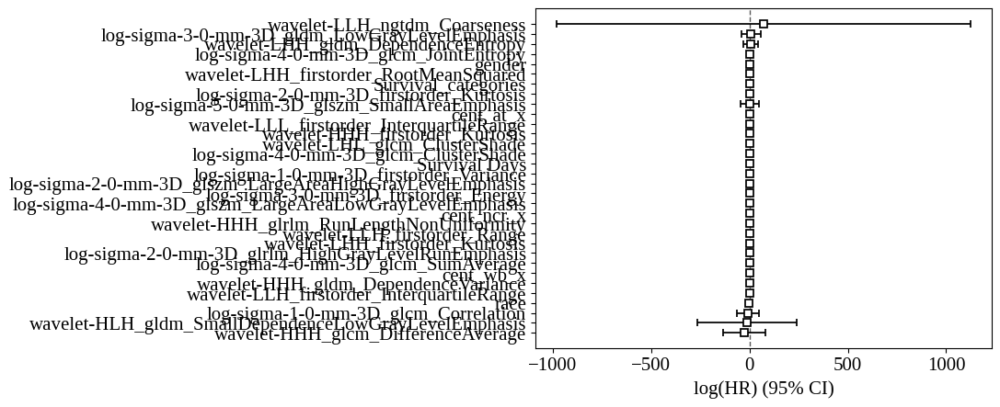

In [ ]:
from lifelines import CoxPHFitter

# Using Cox Proportional Hazards model
cph = CoxPHFitter()
#cph.fit(df, 'Age', event_col='Survival Days')
cph.fit(df, 'Age', event_col='treatment_type')
cph.print_summary()
cph.plot()

In [ ]:
from lifelines.statistics import proportional_hazard_test

results = proportional_hazard_test(cph, df, time_transform='rank')
results.print_summary(decimals=3, model="untransformed variables")

<lifelines.StatisticalResult: proportional_hazard_test>
    time_transform = rank
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 34 total observations, 0 right-censored observations>
         test_name = proportional_hazard_test

---
                                                          test_statistic      p  -log2(p)
Survival_categories                                                 3.28   0.07      3.84
cent_at_x                                                           1.39   0.24      2.07
cent_ncr_x                                                          0.81   0.37      1.44
cent_wb_x                                                           2.06   0.15      2.73
gender                                                             19.54 <0.005     16.63
log-sigma-1-0-mm-3D_firstorder_Variance                             4.93   0.03      5.24
log-sigma-1-0-mm-3D_glcm_Correlation                               16.06 <0.005     13.99
log-sigma-2-0-mm-3D_firstorder_Kurtosis                             3.33   0.07      3.88
log-sigma-2-0-mm-3D_glrlm_HighGrayLevelRunEmphasis                  2.30   0.13      2.95
log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis           18.99 <0.005     16.21
log-sigma-3-0-mm-3D_firstorder_Energy                               1.91   0.17      2.58
log-sigma-3-0-mm-3D_gldm_LowGrayLevelEmphasis                       0.01   0.92      0.13
log-sigma-4-0-mm-3D_glcm_ClusterShade                               0.92   0.34      1.56
log-sigma-4-0-mm-3D_glcm_JointEntropy                               1.01   0.32      1.66
log-sigma-4-0-mm-3D_glcm_SumAverage                                 1.24   0.27      1.91
log-sigma-4-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis             4.17   0.04      4.60
log-sigma-5-0-mm-3D_glszm_SmallAreaEmphasis                         7.14   0.01      7.05
race                                                                1.65   0.20      2.33
treatment_type                                                      0.66   0.42      1.26
wavelet-HHH_firstorder_Kurtosis                                    10.46 <0.005      9.68
wavelet-HHH_glcm_DifferenceAverage                                  0.71   0.40      1.32
wavelet-HHH_gldm_DependenceVariance                                 0.56   0.45      1.14
wavelet-HHH_glrlm_RunLengthNonUniformity                           18.05 <0.005     15.50
wavelet-HLH_gldm_SmallDependenceLowGrayLevelEmphasis                1.78   0.18      2.45
wavelet-LHH_firstorder_Kurtosis                                     4.46   0.03      4.85
wavelet-LHH_firstorder_RootMeanSquared                              0.42   0.52      0.95
wavelet-LHH_gldm_DependenceEntropy                                 12.60 <0.005     11.34
wavelet-LHL_glcm_ClusterShade                                       1.29   0.26      1.97
wavelet-LLH_firstorder_InterquartileRange                           0.22   0.64      0.64
wavelet-LLH_firstorder_Range                                        1.74   0.19      2.42
wavelet-LLH_ngtdm_Coarseness                                       12.16 <0.005     11.00
wavelet-LLL_firstorder_InterquartileRange                          11.56 <0.005     10.54